In [7]:
import os
import numpy as np
import pandas as pd
from matplotlib import colors
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split,GridSearchCV
from sklearn.linear_model import LogisticRegression, LogisticRegressionCV, Perceptron
from sklearn.tree import DecisionTreeClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report
from imblearn.over_sampling import SMOTE
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from xgboost import XGBClassifier
from sklearn.model_selection import KFold
import xgboost as xgb
from sklearn import tree
import warnings
from sklearn.svm import SVC
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from sklearn.pipeline import Pipeline
from functools import reduce
from datetime import date
from sklearn import tree
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation
from keras.layers.normalization import BatchNormalization
from keras.utils import to_categorical
from sklearn.linear_model import SGDClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn import cross_validation, metrics 
from sklearn.decomposition import PCA
warnings.filterwarnings('ignore')

In [8]:
## read the file into dataset
train_data = pd.read_csv('Train.csv',na_values="?")
test_data = pd.read_csv('Test.csv',na_values="?")
complaints_data = pd.read_csv('ComplaintsLog.csv',na_values="?")
compReplacement_data = pd.read_csv('ComponentReplacementLog.csv',na_values="?")
compService_data = pd.read_csv('ComponentServiceLog.csv',na_values="?")
machinesDetails_data = pd.read_csv('MachinesDetails.csv',na_values="?")
operatingConditionsData_data = pd.read_csv('OperatingConditionsData.csv',na_values="?")

In [9]:
##start with machine details data, no changes required as the data is per machine id
machinesDetails_data.head(4)

,MachineID,MachineModel,ServicePeriod
0,MID10801,model4,21
1,MID10802,model4,21
2,MID10803,model1,20
3,MID10804,model2,20


In [10]:
operatingConditionsData_data.head(5)

,Year,Month,Day,Time,MachineID,Sensor1,Sensor2,Sensor3,Sensor4
0,2017,1,1,06:00:00,MID10889,190.860059,402.956047,99.838060,32.369191
1,2017,1,1,07:00:00,MID10889,168.825805,437.673549,116.476080,32.046604
2,2017,1,1,08:00:00,MID10889,157.674385,462.601905,95.230526,53.281389
3,2017,1,1,09:00:00,MID10889,142.552238,515.138959,117.245483,36.525593
4,2017,1,1,10:00:00,MID10889,176.730195,448.725899,95.536274,44.752883


In [11]:
operatingConditionsData_mean=operatingConditionsData_data.groupby(['MachineID']).mean()
operatingConditionsData_min=operatingConditionsData_data.groupby(['MachineID']).min()
operatingConditionsData_max=operatingConditionsData_data.groupby(['MachineID']).max()
operatingConditionsData_median=operatingConditionsData_data.groupby(['MachineID']).median()

In [12]:
operatingConditionsData_std=operatingConditionsData_data.groupby(['MachineID']).std()
operatingConditionsData_skew=operatingConditionsData_data.groupby(['MachineID']).skew()

In [13]:
operatingConditionsData_kurt=operatingConditionsData_data.groupby(['MachineID']).apply(pd.DataFrame.kurt)

In [14]:
operatingConditionsData_mean.drop(['Year','Month','Day'],axis=1, inplace=True)

In [15]:
operatingConditionsData_kurt.drop(['Year','Month','Day'],axis=1, inplace=True)
operatingConditionsData_min.drop(['Year','Month','Day'],axis=1, inplace=True)
operatingConditionsData_max.drop(['Year','Month','Day'],axis=1, inplace=True)
operatingConditionsData_median.drop(['Year','Month','Day'],axis=1, inplace=True)
operatingConditionsData_std.drop(['Year','Month','Day'],axis=1, inplace=True)
operatingConditionsData_skew.drop(['Year','Month','Day'],axis=1, inplace=True)

In [16]:
operatingConditionsData_min.drop(['Time'],axis=1, inplace=True)
operatingConditionsData_max.drop(['Time'],axis=1, inplace=True)

In [17]:
operatingConditionsData_mean.columns = ['Sensor1_Mean','Sensor2_Mean','Sensor3_Mean','Sensor4_Mean']
operatingConditionsData_min.columns = ['Sensor1_Min','Sensor2_Min','Sensor3_Min','Sensor4_Min']
operatingConditionsData_max.columns = ['Sensor1_Max','Sensor2_Max','Sensor3_Max','Sensor4_Max']
operatingConditionsData_median.columns = ['Sensor1_Median','Sensor2_Median','Sensor3_Median','Sensor4_Median']
operatingConditionsData_std.columns = ['Sensor1_Std','Sensor2_Std','Sensor3_Std','Sensor4_Std']
operatingConditionsData_skew.columns = ['Sensor1_Skew','Sensor2_Skew','Sensor3_Skew','Sensor4_Skew']
operatingConditionsData_kurt.columns = ['Sensor1_Kurt','Sensor2_Kurt','Sensor3_Kurt','Sensor4_Kurt']

In [18]:
Final_OperatingCond_data = pd.concat([operatingConditionsData_mean,operatingConditionsData_min,operatingConditionsData_max,
                                     operatingConditionsData_median,operatingConditionsData_std,operatingConditionsData_skew,
                                     operatingConditionsData_kurt],axis=1)

In [19]:
Final_OperatingCond_data.head(4)

,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,Sensor4_Min,Sensor1_Max,Sensor2_Max,...,Sensor3_Std,Sensor4_Std,Sensor1_Skew,Sensor2_Skew,Sensor3_Skew,Sensor4_Skew,Sensor1_Kurt,Sensor2_Kurt,Sensor3_Kurt,Sensor4_Kurt
MachineID,,,,,,,,,,,,,,,,,,,,,
MID10801,170.950549,446.968740,100.705486,40.439431,112.022564,203.089394,61.196704,21.436153,237.389427,649.077702,...,10.639238,5.461348,0.104132,-0.234178,0.269096,0.209216,0.244483,0.330259,0.605587,0.334147
MID10802,170.831815,446.658661,100.881153,40.409810,111.702292,228.250335,64.569891,20.853580,227.913251,652.003603,...,10.985569,5.486794,0.041207,-0.125337,0.336448,0.238907,0.136011,0.084804,0.729800,0.451945
MID10803,170.788710,445.607370,101.318597,40.530980,101.822400,233.724600,67.030620,21.062630,232.159800,630.572000,...,11.605875,5.440913,0.024259,-0.155126,0.642842,0.257505,0.141468,0.153174,1.723591,0.353139
MID10804,171.139981,445.532361,101.644904,40.585271,113.313200,224.222900,60.011690,20.282490,236.903400,655.931700,...,11.768219,5.444207,0.118599,-0.178072,0.570328,0.315562,0.217554,0.212630,1.275973,0.557239


In [20]:
## assign the index as column Machine ID
Final_OperatingCond_data['MachineID']=Final_OperatingCond_data.index

In [21]:
Final_OperatingCond_data.head(4)

,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,Sensor4_Min,Sensor1_Max,Sensor2_Max,...,Sensor4_Std,Sensor1_Skew,Sensor2_Skew,Sensor3_Skew,Sensor4_Skew,Sensor1_Kurt,Sensor2_Kurt,Sensor3_Kurt,Sensor4_Kurt,MachineID
MachineID,,,,,,,,,,,,,,,,,,,,,
MID10801,170.950549,446.968740,100.705486,40.439431,112.022564,203.089394,61.196704,21.436153,237.389427,649.077702,...,5.461348,0.104132,-0.234178,0.269096,0.209216,0.244483,0.330259,0.605587,0.334147,MID10801
MID10802,170.831815,446.658661,100.881153,40.409810,111.702292,228.250335,64.569891,20.853580,227.913251,652.003603,...,5.486794,0.041207,-0.125337,0.336448,0.238907,0.136011,0.084804,0.729800,0.451945,MID10802
MID10803,170.788710,445.607370,101.318597,40.530980,101.822400,233.724600,67.030620,21.062630,232.159800,630.572000,...,5.440913,0.024259,-0.155126,0.642842,0.257505,0.141468,0.153174,1.723591,0.353139,MID10803
MID10804,171.139981,445.532361,101.644904,40.585271,113.313200,224.222900,60.011690,20.282490,236.903400,655.931700,...,5.444207,0.118599,-0.178072,0.570328,0.315562,0.217554,0.212630,1.275973,0.557239,MID10804


In [22]:
## drop the indexes now
Final_OperatingCond_data=Final_OperatingCond_data.reset_index(drop=True)

In [23]:
complaints_data_aggr = complaints_data.groupby(['MachineID', 'ErrorID']).count()

In [24]:
complaints_data_aggr.shape

(4464, 4)

In [25]:
complaints_data_aggr.drop(['Month','Day','Time'],axis=1, inplace=True)

In [26]:
complaints_data_aggr['MachineID'] = [complaints_data_aggr.index[i][0] for i in range(0,complaints_data_aggr.shape[0])]
complaints_data_aggr['ErrorID'] = [complaints_data_aggr.index[i][1] for i in range(0,complaints_data_aggr.shape[0])]

In [27]:
complaints_data_aggr.head(5)

Year MachineID ErrorID
MachineID ErrorID                        
MID10801  error1      3  MID10801  error1
          error2      4  MID10801  error2
          error3      5  MID10801  error3
          error4      2  MID10801  error4
          error5      4  MID10801  error5

In [28]:
unique_machine_ids = np.unique(complaints_data_aggr['MachineID'])

In [29]:
## loop through the unique machine IDs 
Error1 = []
Error2 = []
Error3 = []
Error4 = []
Error5 = []
for i in range(0,len(unique_machine_ids)):
    #Machine_Error['MachineID'][i] = unique_machine_ids[i]
    #DataFor
    if len(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error1')]['Year'])==0:
        Error1.append(0)
    else:        
        Error1.append(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error1')]['Year'][0])
    
    if len(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error2')]['Year'])==0:
        Error2.append(0)
    else:        
        Error2.append(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error2')]['Year'][0])
    
    if len(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error3')]['Year'])==0:
        Error3.append(0)
    else:        
        Error3.append(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error3')]['Year'][0])
    
    if len(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error4')]['Year'])==0:
        Error4.append(0)
    else:        
        Error4.append(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error4')]['Year'][0])
    
    if len(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error5')]['Year'])==0:
        Error5.append(0)
    else:        
        Error5.append(complaints_data_aggr[(complaints_data_aggr['MachineID']==unique_machine_ids[i]) & (complaints_data_aggr['ErrorID']=='error5')]['Year'][0])

In [30]:
## verify
print(len(unique_machine_ids))
print(len(Error1))
print(len(Error2))
print(len(Error3))
print(len(Error4))
print(len(Error5))

1150
1150
1150
1150
1150
1150


In [31]:
## now create a dataframe with the Machine IDs and the Error ID counts
Machine_Error =pd.DataFrame({'MachineID':unique_machine_ids,
                            'Error1':Error1,
                            'Error2':Error2,
                             'Error3':Error3,
                             'Error4':Error4,
                             'Error5':Error5                           
                            })

In [32]:
Machine_Error.head(5)

,MachineID,Error1,Error2,Error3,Error4,Error5
0,MID10801,3,4,5,2,4
1,MID10802,2,3,3,1,2
2,MID10803,6,4,4,6,3
3,MID10804,3,4,4,6,4
4,MID10805,3,2,2,4,5


In [33]:
##now do the same for Component Replacement
compReplacement_data.head(5)

,Year,Month,Day,Time,MachineID,ComponentReplacement
0,2017,1,7,06:00:00,MID10889,Component1
1,2017,2,21,06:00:00,MID10889,Component2
2,2017,3,23,06:00:00,MID10889,Component1
3,2017,6,21,06:00:00,MID10889,Component2
4,2017,2,10,06:00:00,MID10898,Component2


In [34]:
compReplacement_data_aggr = compReplacement_data.groupby(['MachineID','ComponentReplacement']).count()

In [35]:
compReplacement_data_aggr['MachineID'] = [compReplacement_data_aggr.index[i][0] for i in range(0,compReplacement_data_aggr.shape[0])]
compReplacement_data_aggr['ComponentReplacement'] = [compReplacement_data_aggr.index[i][1] for i in range(0,compReplacement_data_aggr.shape[0])]

In [36]:
compReplacement_data_aggr.head(5)

Year  Month  Day  Time MachineID  \
MachineID ComponentReplacement                                     
MID10801  Component1               2      2    2     2  MID10801   
          Component2               2      2    2     2  MID10801   
          Component4               4      4    4     4  MID10801   
MID10802  Component1               1      1    1     1  MID10802   
          Component2               3      3    3     3  MID10802   

                               ComponentReplacement  
MachineID ComponentReplacement                       
MID10801  Component1                     Component1  
          Component2                     Component2  
          Component4                     Component4  
MID10802  Component1                     Component1  
          Component2                     Component2

In [37]:
unique_machine_ids = np.unique(compReplacement_data_aggr['MachineID'])

In [38]:
## loop through the unique machine IDs 
Comp1 = []
Comp2 = []
Comp3 = []
Comp4 = []

for i in range(0,len(unique_machine_ids)):

    if len(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component1')]['Year'])==0:
        Comp1.append(0)
    else:        
        Comp1.append(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component1')]['Year'][0])
    
    if len(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component2')]['Year'])==0:
        Comp2.append(0)
    else:        
        Comp2.append(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component2')]['Year'][0])
    
    if len(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component3')]['Year'])==0:
        Comp3.append(0)
    else:        
        Comp3.append(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component3')]['Year'][0])
    
    if len(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component4')]['Year'])==0:
        Comp4.append(0)
    else:        
        Comp4.append(compReplacement_data_aggr[(compReplacement_data_aggr['MachineID']==unique_machine_ids[i]) & (compReplacement_data_aggr['ComponentReplacement']=='Component4')]['Year'][0])


In [39]:
## now create a dataframe with the Machine IDs and the Component Replacement counts
Comp_Replacement =pd.DataFrame({'MachineID':unique_machine_ids,
                            'Component1':Comp1,
                            'Component2':Comp2,
                             'Component3':Comp3,
                             'Component4':Comp4
                                                    
                            })

In [40]:
Comp_Replacement.shape

(1150, 5)

In [41]:
Comp_Replacement.columns = ['MachineID','ComponentReplaced1','ComponentReplaced2','ComponentReplaced3','ComponentReplaced4']

In [42]:
#compService_data.head(4)
compService_data_aggr1 = compService_data.groupby(['MachineID', 'ComponentAttended']).count()
compService_data_aggr1['MachineID'] = [compService_data_aggr1.index[i][0] for i in range(0,compService_data_aggr1.shape[0])]
compService_data_aggr1['ComponentAttended'] = [compService_data_aggr1.index[i][1] for i in range(0,compService_data_aggr1.shape[0])]
unique_machine_ids = np.unique(compService_data_aggr1['MachineID'])

In [43]:
compService_data_aggr1.head(4)

Year  Month  Day  Time  ServiceType MachineID  \
MachineID ComponentAttended                                                  
MID10801  Component1            5      5    5     5            5  MID10801   
          Component2            7      7    7     7            7  MID10801   
          Component3            7      7    7     7            7  MID10801   
          Component4            8      8    8     8            8  MID10801   

                            ComponentAttended  
MachineID ComponentAttended                    
MID10801  Component1               Component1  
          Component2               Component2  
          Component3               Component3  
          Component4               Component4

In [44]:
## loop through the unique machine IDs 
CompA1 = []
CompA2 = []
CompA3 = []
CompA4 = []
for i in range(0,len(unique_machine_ids)):
    #Machine_Error['MachineID'][i] = unique_machine_ids[i]
    #DataFor
    if len(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component1')]['Year'])==0:
        CompA1.append(0)
    else:        
        CompA1.append(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component1')]['Year'][0])
    
    if len(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component2')]['Year'])==0:
        CompA2.append(0)
    else:        
        CompA2.append(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component2')]['Year'][0])
    
    if len(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component3')]['Year'])==0:
        CompA3.append(0)
    else:        
        CompA3.append(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component3')]['Year'][0])
    
    if len(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component4')]['Year'])==0:
        CompA4.append(0)
    else:        
        CompA4.append(compService_data_aggr1[(compService_data_aggr1['MachineID']==unique_machine_ids[i]) & (compService_data_aggr1['ComponentAttended']=='Component4')]['Year'][0])
    
   

In [45]:
## now create a dataframe with the Machine IDs and the Component Attended counts
Comp_Attended =pd.DataFrame({'MachineID':unique_machine_ids,
                            'ComponentAttended1':CompA1,
                            'ComponentAttended2':CompA2,
                             'ComponentAttended3':CompA3,
                             'ComponentAttended4':CompA4
                                                    
                            })

In [46]:
Comp_Attended.head(4)

,MachineID,ComponentAttended1,ComponentAttended2,ComponentAttended3,ComponentAttended4
0,MID10801,5,7,7,8
1,MID10802,3,10,6,11
2,MID10803,6,7,7,5
3,MID10804,9,8,8,8


In [47]:
## do the same for ServiceType
#compService_data.head(4)
compService_data_aggr2 = compService_data.groupby(['MachineID', 'ServiceType']).count()
compService_data_aggr2['MachineID'] = [compService_data_aggr2.index[i][0] for i in range(0,compService_data_aggr2.shape[0])]
compService_data_aggr2['ServiceType'] = [compService_data_aggr2.index[i][1] for i in range(0,compService_data_aggr2.shape[0])]
unique_machine_ids = np.unique(compService_data_aggr1['MachineID'])

In [48]:
## loop through the unique machine IDs 
Service1 = []
Service2 = []

for i in range(0,len(unique_machine_ids)):
    #Machine_Error['MachineID'][i] = unique_machine_ids[i]
    #DataFor
    if len(compService_data_aggr2[(compService_data_aggr2['MachineID']==unique_machine_ids[i]) & (compService_data_aggr2['ServiceType']=='ComponentRepair')]['Year'])==0:
        Service1.append(0)
    else:        
        Service1.append(compService_data_aggr2[(compService_data_aggr2['MachineID']==unique_machine_ids[i]) & (compService_data_aggr2['ServiceType']=='ComponentRepair')]['Year'][0])
    
    if len(compService_data_aggr2[(compService_data_aggr2['MachineID']==unique_machine_ids[i]) & (compService_data_aggr2['ServiceType']=='ScheduledService')]['Year'])==0:
        Service2.append(0)
    else:        
        Service2.append(compService_data_aggr2[(compService_data_aggr2['MachineID']==unique_machine_ids[i]) & (compService_data_aggr2['ServiceType']=='ScheduledService')]['Year'][0])
    
 

In [49]:
## now create a dataframe with the Machine IDs and the Component Attended counts
Service_Type =pd.DataFrame({'MachineID':unique_machine_ids,
                            'ComponentRepair':Service1,
                            'ScheduledService':Service2
                                                    
                            })

In [50]:
Service_Type.head(3)

,MachineID,ComponentRepair,ScheduledService
0,MID10801,26,1
1,MID10802,29,1
2,MID10803,23,2


In [51]:
Final_OperatingCond_data1 = Final_OperatingCond_data.copy()

In [52]:
Final_OperatingCond_data1 = Final_OperatingCond_data1.reset_index(drop=True)

In [53]:
print(Final_OperatingCond_data1.shape)
print(Machine_Error.shape)
print(Comp_Replacement.shape)
print(Comp_Attended.shape)
print(Service_Type.shape)

(1150, 29)
(1150, 6)
(1150, 5)
(1150, 5)
(1150, 3)


In [54]:
## Merge all the dataframes
dfs = [machinesDetails_data,Final_OperatingCond_data1,Machine_Error,Comp_Replacement,Comp_Attended,Service_Type]
df_final = reduce(lambda left,right: pd.merge(left,right,on='MachineID'), dfs)

In [55]:
df_final.columns

Index(['MachineID', 'MachineModel', 'ServicePeriod', 'Sensor1_Mean',
       'Sensor2_Mean', 'Sensor3_Mean', 'Sensor4_Mean', 'Sensor1_Min',
       'Sensor2_Min', 'Sensor3_Min', 'Sensor4_Min', 'Sensor1_Max',
       'Sensor2_Max', 'Sensor3_Max', 'Sensor4_Max', 'Sensor1_Median',
       'Sensor2_Median', 'Sensor3_Median', 'Sensor4_Median', 'Sensor1_Std',
       'Sensor2_Std', 'Sensor3_Std', 'Sensor4_Std', 'Sensor1_Skew',
       'Sensor2_Skew', 'Sensor3_Skew', 'Sensor4_Skew', 'Sensor1_Kurt',
       'Sensor2_Kurt', 'Sensor3_Kurt', 'Sensor4_Kurt', 'Error1', 'Error2',
       'Error3', 'Error4', 'Error5', 'ComponentReplaced1',
       'ComponentReplaced2', 'ComponentReplaced3', 'ComponentReplaced4',
       'ComponentAttended1', 'ComponentAttended2', 'ComponentAttended3',
       'ComponentAttended4', 'ComponentRepair', 'ScheduledService'],
      dtype='object')

In [56]:
df_final.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1150 entries, 0 to 1149
Data columns (total 46 columns):
MachineID             1150 non-null object
MachineModel          1150 non-null object
ServicePeriod         1150 non-null int64
Sensor1_Mean          1150 non-null float64
Sensor2_Mean          1150 non-null float64
Sensor3_Mean          1150 non-null float64
Sensor4_Mean          1150 non-null float64
Sensor1_Min           1150 non-null float64
Sensor2_Min           1150 non-null float64
Sensor3_Min           1150 non-null float64
Sensor4_Min           1150 non-null float64
Sensor1_Max           1150 non-null float64
Sensor2_Max           1150 non-null float64
Sensor3_Max           1150 non-null float64
Sensor4_Max           1150 non-null float64
Sensor1_Median        1150 non-null float64
Sensor2_Median        1150 non-null float64
Sensor3_Median        1150 non-null float64
Sensor4_Median        1150 non-null float64
Sensor1_Std           1150 non-null float64
Sensor2_Std      

In [57]:
## create 3 columns for lastComplainDays, LastCompReplacementDays and LastCompServiceDays for a machine
## sonce we also have to account for the date time values given

In [58]:
def ConverttoDate(year,month,day):
    return date(year,month,day)

def CalculateDaysfromCurrDate(date_input):
    currentdate=date(2018, 9, 30)
    diff=str(currentdate-date_input)
    return diff.split(sep=',')[0].split(' ')[0]

In [59]:
# create a column as date for dateframes complaints_data, compReplacement_data and compService_data
complaints_data['ComplainDate']=complaints_data.apply(lambda x: ConverttoDate(x['Year'],x['Month'],x['Day']), axis=1)
compReplacement_data['CompReplacementDate']=compReplacement_data.apply(lambda x: ConverttoDate(x['Year'],x['Month'],x['Day']), axis=1)
compService_data['CompServiceDate']=compService_data.apply(lambda x: ConverttoDate(x['Year'],x['Month'],x['Day']), axis=1)

In [60]:
##find the max date group by MachineID for complaints_data, compReplacement_data and compService_data
complaints_data_aggr = complaints_data.groupby(['MachineID'])['ComplainDate'].max()
compReplacement_data_aggr = compReplacement_data.groupby(['MachineID'])['CompReplacementDate'].max()
compService_data_aggr = compService_data.groupby(['MachineID'])['CompServiceDate'].max()

In [61]:
## rename the columns
complaints_data_aggr = pd.DataFrame(complaints_data_aggr)
complaints_data_aggr.columns = ['LastComplainDate']
compReplacement_data_aggr = pd.DataFrame(compReplacement_data_aggr)
compReplacement_data_aggr.columns = ['LastCompReplaceDate']
compService_data_aggr = pd.DataFrame(compService_data_aggr)
compService_data_aggr.columns = ['LastCompServiceDate']

In [62]:
##Calculate the days from the dates
complaints_data_aggr['LastComplainDays']=complaints_data_aggr.apply(lambda x: CalculateDaysfromCurrDate(x['LastComplainDate']), axis=1)
compReplacement_data_aggr['LastCompReplaceDays']=compReplacement_data_aggr.apply(lambda x: CalculateDaysfromCurrDate(x['LastCompReplaceDate']), axis=1)
compService_data_aggr['LastComplainServiceDays']=compService_data_aggr.apply(lambda x: CalculateDaysfromCurrDate(x['LastCompServiceDate']), axis=1)

In [63]:
## Create a MachineID column for them and assign the indexes
complaints_data_aggr['MachineID'] = complaints_data_aggr.index.tolist()
compReplacement_data_aggr['MachineID'] = compReplacement_data_aggr.index.tolist()
compService_data_aggr['MachineID'] = compService_data_aggr.index.tolist()

In [64]:
complaints_data_aggr.shape

(1150, 3)

In [65]:
complaints_data_days = complaints_data_aggr.drop(['LastComplainDate'], axis=1)

In [66]:
compReplacement_data_days=compReplacement_data_aggr.drop(['LastCompReplaceDate'],axis=1)
compService_data_days=compService_data_aggr.drop(['LastCompServiceDate'],axis=1)

In [67]:
complaints_data_days=complaints_data_days.reset_index(drop=True)

In [68]:
compReplacement_data_days = compReplacement_data_days.reset_index(drop=True)
compService_data_days = compService_data_days.reset_index(drop=True)

In [69]:
## Now append these 3 columns with the df_final data frame
dfs = [df_final,complaints_data_days,compReplacement_data_days,compService_data_days]
merged_data = reduce(lambda left,right: pd.merge(left,right,on='MachineID'), dfs)

In [70]:
merged_data.shape

(1150, 49)

In [71]:
## add 2 more features
merged_data['MachineModelPattern']=[1 if merged_data['MachineModel'][i]=='model2' else 0 for i in range(0,merged_data.shape[0])]
merged_data['ServicePeriodPattern']=[1 if (merged_data['ServicePeriod'][i]>3) & (merged_data['ServicePeriod'][i]<=10) else 0 for i in range(0,merged_data.shape[0])]

In [72]:
## copy to a file for backup
##merged_data.to_csv('UniqueMachine1.csv',index=False)
##read the file
##merged_data = pd.read_csv('UniqueMachine.csv')

In [73]:
merged_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1150 entries, 0 to 1149
Data columns (total 51 columns):
MachineID                  1150 non-null object
MachineModel               1150 non-null object
ServicePeriod              1150 non-null int64
Sensor1_Mean               1150 non-null float64
Sensor2_Mean               1150 non-null float64
Sensor3_Mean               1150 non-null float64
Sensor4_Mean               1150 non-null float64
Sensor1_Min                1150 non-null float64
Sensor2_Min                1150 non-null float64
Sensor3_Min                1150 non-null float64
Sensor4_Min                1150 non-null float64
Sensor1_Max                1150 non-null float64
Sensor2_Max                1150 non-null float64
Sensor3_Max                1150 non-null float64
Sensor4_Max                1150 non-null float64
Sensor1_Median             1150 non-null float64
Sensor2_Median             1150 non-null float64
Sensor3_Median             1150 non-null float64
Sensor4_Median 

In [74]:
## check if there are Null Values
merged_data.isnull().sum()

MachineID                  0
MachineModel               0
ServicePeriod              0
Sensor1_Mean               0
Sensor2_Mean               0
Sensor3_Mean               0
Sensor4_Mean               0
Sensor1_Min                0
Sensor2_Min                0
Sensor3_Min                0
Sensor4_Min                0
Sensor1_Max                0
Sensor2_Max                0
Sensor3_Max                0
Sensor4_Max                0
Sensor1_Median             0
Sensor2_Median             0
Sensor3_Median             0
Sensor4_Median             0
Sensor1_Std                0
Sensor2_Std                0
Sensor3_Std                0
Sensor4_Std                0
Sensor1_Skew               0
Sensor2_Skew               0
Sensor3_Skew               0
Sensor4_Skew               0
Sensor1_Kurt               0
Sensor2_Kurt               0
Sensor3_Kurt               0
Sensor4_Kurt               0
Error1                     0
Error2                     0
Error3                     0
Error4        

In [75]:
merged_data.head(5)

,MachineID,MachineModel,ServicePeriod,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,...,ComponentAttended2,ComponentAttended3,ComponentAttended4,ComponentRepair,ScheduledService,LastComplainDays,LastCompReplaceDays,LastComplainServiceDays,MachineModelPattern,ServicePeriodPattern
0,MID10801,model4,21,170.950549,446.968740,100.705486,40.439431,112.022564,203.089394,61.196704,...,7,7,8,26,1,304,318,318,0,0
1,MID10802,model4,21,170.831815,446.658661,100.881153,40.409810,111.702292,228.250335,64.569891,...,10,6,11,29,1,355,354,309,0,0
2,MID10803,model1,20,170.788710,445.607370,101.318597,40.530980,101.822400,233.724600,67.030620,...,7,7,5,23,2,309,311,311,0,0
3,MID10804,model2,20,171.139981,445.532361,101.644904,40.585271,113.313200,224.222900,60.011690,...,8,8,8,33,0,314,313,313,1,0
4,MID10805,model2,20,170.769392,447.885188,101.445096,40.607215,114.975200,240.432100,62.953690,...,5,5,11,27,2,304,318,318,1,0


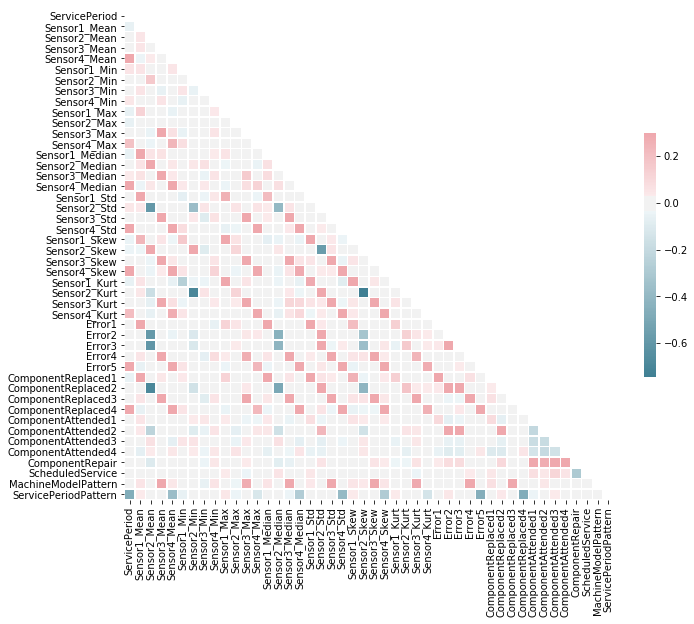

In [76]:
corr = merged_data.corr()
# Generate a mask for the upper triangle
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True
f, ax = plt.subplots(figsize=(11, 9))
cmap = sns.diverging_palette(220, 10, as_cmap=True)
# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5, cbar_kws={"shrink": .5})

In [77]:
##Dummify the MachineModel values as these are categorical
final_data_dummies = pd.get_dummies(merged_data,columns=['MachineModel'])

In [78]:
final_data_dummies.head(4)

,MachineID,ServicePeriod,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,Sensor4_Min,...,ScheduledService,LastComplainDays,LastCompReplaceDays,LastComplainServiceDays,MachineModelPattern,ServicePeriodPattern,MachineModel_model1,MachineModel_model2,MachineModel_model3,MachineModel_model4
0,MID10801,21,170.950549,446.968740,100.705486,40.439431,112.022564,203.089394,61.196704,21.436153,...,1,304,318,318,0,0,0,0,0,1
1,MID10802,21,170.831815,446.658661,100.881153,40.409810,111.702292,228.250335,64.569891,20.853580,...,1,355,354,309,0,0,0,0,0,1
2,MID10803,20,170.788710,445.607370,101.318597,40.530980,101.822400,233.724600,67.030620,21.062630,...,2,309,311,311,0,0,1,0,0,0
3,MID10804,20,171.139981,445.532361,101.644904,40.585271,113.313200,224.222900,60.011690,20.282490,...,0,314,313,313,1,0,0,1,0,0


In [79]:
##get all the train and test Machine IDs
MachineIDs_train = train_data['MachineID']
MachineIDs_test = test_data['MachineID']

In [80]:
## lets separate the train and test now
data_model_build = final_data_dummies[final_data_dummies['MachineID'].isin(MachineIDs_train)]
data_model_build = data_model_build.reset_index(drop=True)
##create a dictionary of Machine ID and the target variable ActionPoint
train_target_dict = { k:v for (k,v) in zip(train_data['MachineID'], train_data['ActionPoint'])}   
data_model_build['ActionPoint'] = [train_target_dict.get(i) for i in data_model_build['MachineID']]

In [81]:
##create data frame for the test data for submission
test_data_sub=final_data_dummies[final_data_dummies['MachineID'].isin(MachineIDs_test)]
test_data_sub= test_data_sub.reset_index(drop=True)

In [82]:
##check the shape
print(data_model_build.shape)
print(test_data_sub.shape)

(674, 55)
(326, 54)


In [83]:
##check class imbalance, Only 10% of the data is ComponenReplacement
data_model_build['ActionPoint'].value_counts()

ComponentRepair         413
NoIssue                 191
ComponentReplacement     70
Name: ActionPoint, dtype: int64

In [84]:
data=data_model_build.loc[: , data_model_build.columns != 'ActionPoint']

In [85]:
data = data.reset_index(drop=True)

In [86]:
data.drop(['MachineID'],axis=1,inplace=True)

In [87]:
target_dict = {'ComponentRepair' :0 , 'NoIssue': 1, 'ComponentReplacement':2}

In [155]:
target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue', 2: 'ComponentReplacement'}

In [88]:
labels = [ target_dict.get(data_model_build['ActionPoint'][i]) for i in range(0,data_model_build.shape[0])]

In [353]:
##split train and test 
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.4, random_state=1234, stratify=labels)

In [90]:
## try NaaiveBayes
model_NB = GaussianNB()
model_NB.fit(x_train,y_train)

GaussianNB(priors=None)

In [91]:
## check accuracy and confusion matrix
train_accuracy= model_NB.score(x_train,y_train)
test_accuracy= model_NB.score(x_test,y_test)
predictions=model_NB.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))
predictions_nb = model_NB.predict(data)

0.5816831683168316
0.48148148148148145
[[85 52 28]
 [35 33  9]
 [13  3 12]]
             precision    recall  f1-score   support

          0       0.64      0.52      0.57       165
          1       0.38      0.43      0.40        77
          2       0.24      0.43      0.31        28

avg / total       0.52      0.48      0.50       270



In [121]:
## logistic regression
logreg = LogisticRegression(multi_class="multinomial", solver="newton-cg")
logreg.fit(x_train, y_train)
predictions = logreg.predict(x_test)
print('Accuracy of logistic regression classifier on test set: {:.2f}'.format(logreg.score(x_test, y_test)))
confmatrix = confusion_matrix(y_test,predictions)
print(confmatrix)
print(classification_report(y_test, predictions)) #newton-cg, lbfgs, sag and saga
predictions_lg= logreg.predict(data)

Accuracy of logistic regression classifier on test set: 0.60
[[128  28   9]
 [ 50  27   0]
 [ 19   3   6]]
             precision    recall  f1-score   support

          0       0.65      0.78      0.71       165
          1       0.47      0.35      0.40        77
          2       0.40      0.21      0.28        28

avg / total       0.57      0.60      0.58       270



In [354]:
## try with cross validation in Logistic
lr_cv_model = LogisticRegressionCV(n_jobs=-1, random_state=786, Cs=[1,3,5,8], cv=10, refit=True,multi_class='multinomial'
                                   , class_weight={0:1,1:2,2:5},solver='newton-cg')
lr_cv_model.fit(x_train, y_train)

Exception ignored in: <bound method DMatrix.__del__ of <xgboost.core.DMatrix object at 0x000000003D69D4A8>>
Traceback (most recent call last):
  File "D:\Anaconda3\lib\site-packages\xgboost\core.py", line 482, in __del__
    if self.handle is not None:
AttributeError: 'DMatrix' object has no attribute 'handle'


LogisticRegressionCV(Cs=[1, 3, 5, 8], class_weight={0: 1, 1: 2, 2: 5}, cv=10,
           dual=False, fit_intercept=True, intercept_scaling=1.0,
           max_iter=100, multi_class='multinomial', n_jobs=-1,
           penalty='l2', random_state=786, refit=True, scoring=None,
           solver='newton-cg', tol=0.0001, verbose=0)

In [356]:
## check accuracy and confusion matrix
train_accuracy= lr_cv_model.score(x_train,y_train)
test_accuracy= lr_cv_model.score(x_test,y_test)
predictions=lr_cv_model.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))

0.6435643564356436
0.5259259259259259
[[77 51 37]
 [24 47  6]
 [ 6  4 18]]
             precision    recall  f1-score   support

          0       0.72      0.47      0.57       165
          1       0.46      0.61      0.53        77
          2       0.30      0.64      0.40        28

avg / total       0.60      0.53      0.54       270



In [358]:
print(x_train.shape)
print(test_data_sub.shape)

(404, 53)
(326, 54)


In [362]:
test_data_sub1= test_data_sub.drop(['MachineID'],axis=1)
predictions_test_lr = lr_cv_model.predict(test_data_sub1)
## write to file
target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue', 2: 'ComponentReplacement'}
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test_lr]
rf_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
rf_sub_df.columns = ['MachineID','ActionPoint']
rf_sub_df.to_csv('Logistic_Regression_CV.csv')

In [242]:
decisiontree_model = tree.DecisionTreeClassifier(criterion='entropy',class_weight='balanced',random_state=786, max_depth=None)
decisiontree_model.fit(x_train,y_train)
train_accuracy= decisiontree_model.score(x_train,y_train)
test_accuracy= decisiontree_model.score(x_test,y_test)
predictions=decisiontree_model.predict(x_test)
print(train_accuracy)
print(test_accuracy)
print(classification_report(y_test, predictions))
predictions_dt=decisiontree_model.predict(data)

1.0
0.4888888888888889
             precision    recall  f1-score   support

          0       0.61      0.63      0.62       165
          1       0.32      0.31      0.32        77
          2       0.16      0.14      0.15        28

avg / total       0.48      0.49      0.49       270



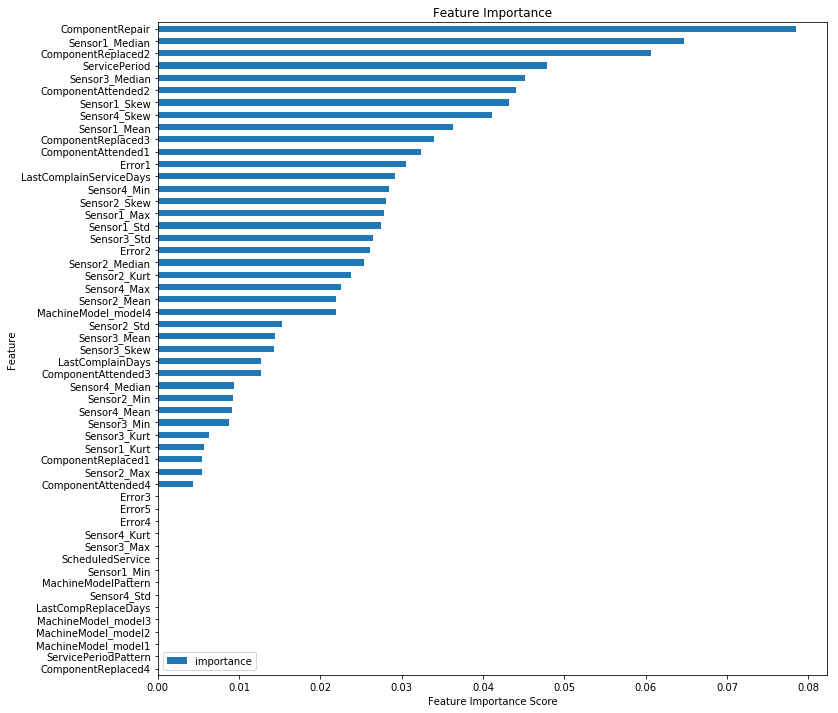

In [96]:
feat_imp = pd.DataFrame({'importance':decisiontree_model.feature_importances_})    
feat_imp['Feature'] = data.columns
feat_imp.sort_values(by='importance', ascending=False, inplace=True)
imp_features = feat_imp.iloc[:28]
feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('Feature', drop=True)
feat_imp.plot.barh(title='Feature Importance', figsize=(12,12))
plt.xlabel('Feature Importance Score')
plt.show()

In [97]:
## try class balancing using SMOTE
os = SMOTE(random_state=0,ratio={0:248 , 1:114, 2:400})
os_data_X,os_data_y=os.fit_sample(x_train,y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=x_train.columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=["ActionPoint"])

In [98]:
decisiontree_model_smote = tree.DecisionTreeClassifier(criterion='gini',class_weight=None,random_state=786, max_depth=8)
decisiontree_model_smote.fit(os_data_X,os_data_y)
train_accuracy= decisiontree_model_smote.score(x_train,y_train)
test_accuracy= decisiontree_model_smote.score(x_test,y_test)
predictions=decisiontree_model_smote.predict(x_test)
print(train_accuracy)
print(test_accuracy)
print(classification_report(y_test, predictions))

0.9034653465346535
0.4703703703703704
             precision    recall  f1-score   support

          0       0.63      0.53      0.57       165
          1       0.48      0.42      0.45        77
          2       0.12      0.29      0.17        28

avg / total       0.54      0.47      0.50       270



In [99]:
imp_feature_list_dt = [i for i in imp_features['Feature']]

In [100]:
x_train_imp = x_train.loc[:,imp_feature_list_dt]

In [101]:
x_test_imp = x_test.loc[:,imp_feature_list_dt]

In [102]:
decisiontree_model_imp = tree.DecisionTreeClassifier(criterion='entropy',class_weight='balanced',random_state=786, max_depth=10)
decisiontree_model_imp.fit(x_train_imp,y_train)
train_accuracy= decisiontree_model_imp.score(x_train_imp,y_train)
test_accuracy= decisiontree_model_imp.score(x_test_imp,y_test)
predictions=decisiontree_model_imp.predict(x_test_imp)
print(classification_report(y_test, predictions))

             precision    recall  f1-score   support

          0       0.61      0.59      0.60       165
          1       0.35      0.38      0.36        77
          2       0.15      0.14      0.15        28

avg / total       0.49      0.48      0.48       270



In [103]:
## try SVM
svm_model = SVC(C=10, kernel='linear', class_weight={0:1,1:0.5,2:5}, verbose=False, random_state=786)
svm_model.fit(x_train,y_train)

SVC(C=10, cache_size=200, class_weight={0: 1, 1: 0.5, 2: 5}, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=786, shrinking=True,
  tol=0.001, verbose=False)

In [104]:
## check accuracy and confusion matrix
train_accuracy= svm_model.score(x_train,y_train)
test_accuracy= svm_model.score(x_test,y_test)
predictions=svm_model.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(predictions,y_test))  
predictions_svm=svm_model.predict(data)

0.6212871287128713
0.5148148148148148
[[110  13  42]
 [ 60  13   4]
 [ 12   0  16]]
             precision    recall  f1-score   support

          0       0.67      0.60      0.63       182
          1       0.17      0.50      0.25        26
          2       0.57      0.26      0.36        62

avg / total       0.60      0.51      0.53       270



In [105]:
## try SVM with important variables
svm_model = SVC(C=10, kernel='linear', class_weight={0:1,1:0.5,2:5}, verbose=False, random_state=786)
svm_model.fit(x_train_imp,y_train)

SVC(C=10, cache_size=200, class_weight={0: 1, 1: 0.5, 2: 5}, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=786, shrinking=True,
  tol=0.001, verbose=False)

In [106]:
## check accuracy and confusion matrix
train_accuracy= svm_model.score(x_train_imp,y_train)
test_accuracy= svm_model.score(x_test_imp,y_test)
predictions=svm_model.predict(x_test_imp)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(predictions,y_test))  

0.5643564356435643
0.4703703703703704
[[105   6  54]
 [ 60   6  11]
 [ 10   2  16]]
             precision    recall  f1-score   support

          0       0.64      0.60      0.62       175
          1       0.08      0.43      0.13        14
          2       0.57      0.20      0.29        81

avg / total       0.59      0.47      0.50       270



In [141]:
## try class balancing using SMOTE
os = SMOTE(random_state=0,ratio={0:248 , 1:114, 2:220})

In [142]:
target_train = pd.DataFrame(y_train)
target_train.columns = ['ActionPoint']

In [143]:
target_train['ActionPoint'].value_counts()

0    248
1    114
2     42
Name: ActionPoint, dtype: int64

In [144]:
##separate the data and the labels
data_train_X=data_model_build.loc[:,data_model_build.columns != 'ActionPoint']
data_train_y= data_model_build['ActionPoint']

In [145]:
data_train_X = data_train_X.set_index('MachineID')

In [146]:
os_data_X,os_data_y=os.fit_sample(x_train,y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=x_train.columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=["ActionPoint"])

In [150]:
## Random forest with the important variables of decision tree with SMOTE overampling
model_rf_smote= RandomForestClassifier(n_estimators=10, criterion='gini', max_depth=6, n_jobs=-1,
                                       random_state=786)

In [151]:
model_rf_smote.fit(os_data_X,os_data_y)

RandomForestClassifier(bootstrap=True, class_weight=None, criterion='gini',
            max_depth=6, max_features='auto', max_leaf_nodes=None,
            min_impurity_decrease=0.0, min_impurity_split=None,
            min_samples_leaf=1, min_samples_split=2,
            min_weight_fraction_leaf=0.0, n_estimators=10, n_jobs=-1,
            oob_score=False, random_state=786, verbose=0, warm_start=False)

In [152]:
## check accuracy and confusion matrix
train_accuracy= model_rf_smote.score(os_data_X,os_data_y)
test_accuracy= model_rf_smote.score(x_test,y_test)
predictions=model_rf_smote.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(predictions,y_test))  
#predictions_rf=model_rf_smote.predict(data)

0.9054982817869416
0.5444444444444444
[[122  19  24]
 [ 61  15   1]
 [ 17   1  10]]
             precision    recall  f1-score   support

          0       0.74      0.61      0.67       200
          1       0.19      0.43      0.27        35
          2       0.36      0.29      0.32        35

avg / total       0.62      0.54      0.57       270



In [134]:
target_test = pd.DataFrame(y_test)
target_test.columns = ['ActionPoint']

In [135]:
target_test['ActionPoint'].value_counts()

0    165
1     77
2     28
Name: ActionPoint, dtype: int64

In [136]:
print(classification_report(predictions,y_test))  

             precision    recall  f1-score   support

          0       0.82      0.62      0.71       220
          1       0.12      0.35      0.17        26
          2       0.32      0.38      0.35        24

avg / total       0.71      0.57      0.62       270



In [153]:
test_data_sub1= test_data_sub.drop(['MachineID'],axis=1)
predictions_test = model_rf_smote.predict(test_data_sub1)

In [156]:
## write to file
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test]
rf_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
rf_sub_df.columns = ['MachineID','ActionPoint']
rf_sub_df.to_csv('Random_Forest_SMOTE_te.csv')

In [157]:
target = pd.DataFrame(labels)

In [158]:
target.columns = ['ActionPoint']

In [159]:
target['ActionPoint'].value_counts()

0    413
1    191
2     70
Name: ActionPoint, dtype: int64

In [160]:
## try doing normal random forest
#x_train, x_test, y_train, y_test
## can use gini also as criterion, use max_depth to regularize
## n_samples / (n_classes * np.bincount(y))
randomforest_model = RandomForestClassifier(n_estimators=20, criterion='entropy', max_depth=5, n_jobs=-1, random_state=786, verbose=0
                                            , class_weight='balanced')
randomforest_model.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=5, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=20, n_jobs=-1, oob_score=False, random_state=786,
            verbose=0, warm_start=False)

In [161]:
## check accuracy and confusion matrix
test_accuracy= randomforest_model.score(x_test,y_test)
predictions= randomforest_model.predict(x_test)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.5777777777777777
[[116  40   9]
 [ 39  37   1]
 [ 23   2   3]]
             precision    recall  f1-score   support

          0       0.65      0.70      0.68       165
          1       0.47      0.48      0.47        77
          2       0.23      0.11      0.15        28

avg / total       0.56      0.58      0.56       270



In [162]:
train_target= pd.DataFrame(y_train)
train_target.columns = ['ActionPoint']
train_target['ActionPoint'].value_counts()

0    248
1    114
2     42
Name: ActionPoint, dtype: int64

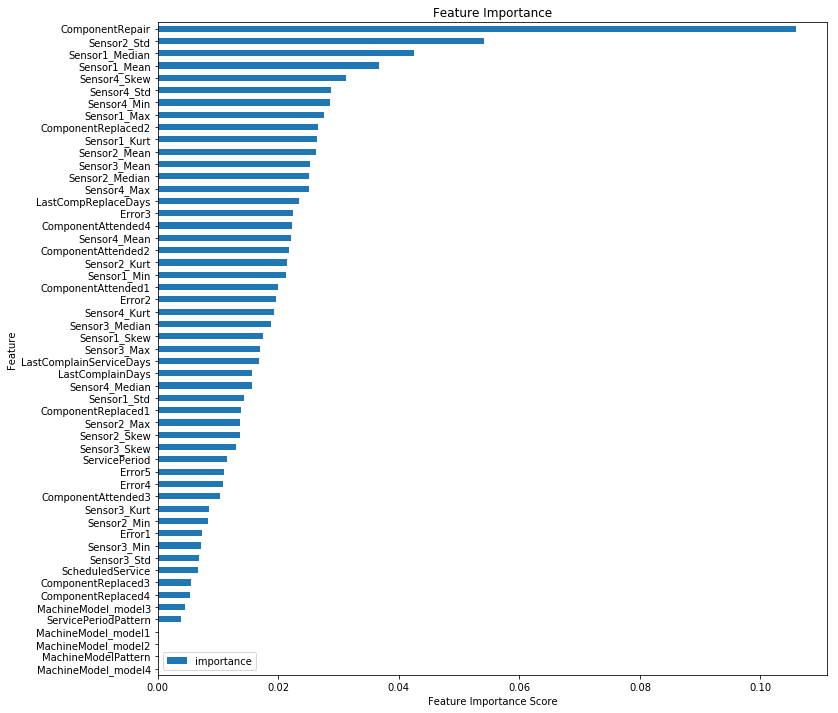

In [163]:
feat_imp = pd.DataFrame({'importance':randomforest_model.feature_importances_})    
feat_imp['Feature'] = x_train.columns
feat_imp.sort_values(by='importance', ascending=False, inplace=True)
#imp_features = feat_imp.iloc[:28]
feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('Feature', drop=True)
feat_imp.plot.barh(title='Feature Importance', figsize=(12,12))
plt.xlabel('Feature Importance Score')
plt.show()

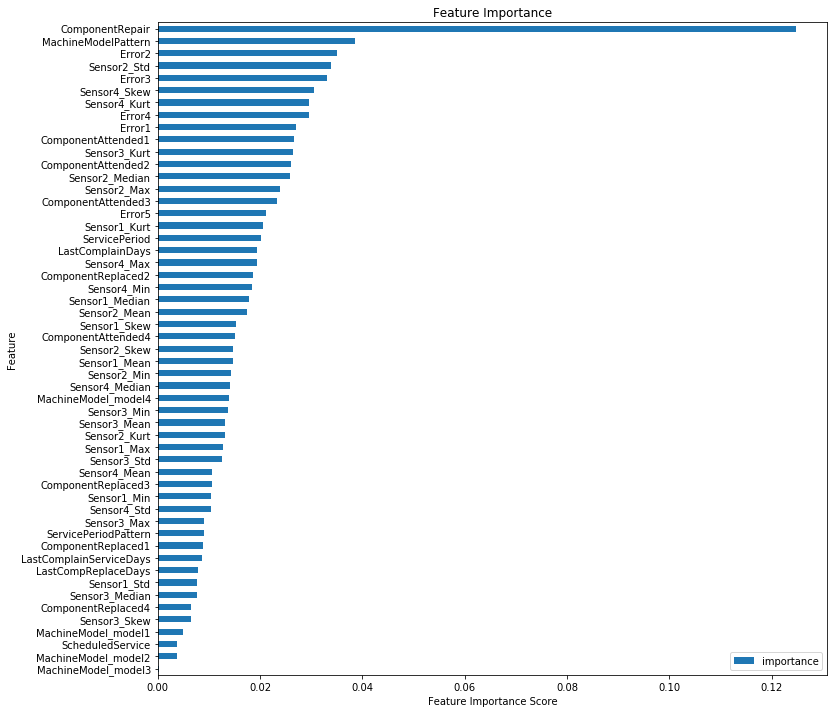

In [165]:
feat_imp = pd.DataFrame({'importance':model_rf_smote.feature_importances_})    
feat_imp['Feature'] = x_train.columns
feat_imp.sort_values(by='importance', ascending=False, inplace=True)
#imp_features = feat_imp.iloc[:28]
feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('Feature', drop=True)
feat_imp.plot.barh(title='Feature Importance', figsize=(12,12))
plt.xlabel('Feature Importance Score')
plt.show()

In [166]:
imp_features = feat_imp.iloc[:50]

In [167]:
imp_feature_list_rf = [i for i in imp_features.index]
x_train_imp_rf = x_train.loc[:,imp_feature_list_rf]
x_test_imp_rf = x_test.loc[:,imp_feature_list_rf]

In [168]:
## random forest with top 30 variables of random forest
randomforest_model_imp_rf = RandomForestClassifier(n_estimators=20, criterion='entropy', max_depth=5, n_jobs=-1, random_state=786
                                            ,class_weight={0:1,1:1,2:5},verbose=0)    
randomforest_model_imp_rf.fit(x_train_imp_rf,y_train)

RandomForestClassifier(bootstrap=True, class_weight={0: 1, 1: 1, 2: 5},
            criterion='entropy', max_depth=5, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=20, n_jobs=-1, oob_score=False, random_state=786,
            verbose=0, warm_start=False)

In [169]:
## check accuracy and confusion matrix
test_accuracy= randomforest_model_imp_rf.score(x_test_imp_rf,y_test)
predictions= randomforest_model_imp_rf.predict(x_test_imp_rf)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.6074074074074074
[[159   0   6]
 [ 74   1   2]
 [ 24   0   4]]
             precision    recall  f1-score   support

          0       0.62      0.96      0.75       165
          1       1.00      0.01      0.03        77
          2       0.33      0.14      0.20        28

avg / total       0.70      0.61      0.49       270



In [170]:
## try with sample_weight
weight_2 = (1/(70))*0.8*326
weight_1 = (1/(191))*0.1*326
weight_0 = (1/(413))*0.1*326
sample_weight = np.array([ weight_2 if i == 2 else weight_1 if i==1 else weight_0 for i in y_train])

In [171]:
data_model_build.ActionPoint.value_counts()

ComponentRepair         413
NoIssue                 191
ComponentReplacement     70
Name: ActionPoint, dtype: int64

In [172]:
## n_samples / (n_classes * np.bincount(y))
randomforest_model_imp = RandomForestClassifier(n_estimators=20, criterion='entropy', max_depth=5, n_jobs=-1, random_state=786
                                            ,class_weight='balanced',verbose=0)    
randomforest_model_imp.fit(x_train_imp,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=5, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=20, n_jobs=-1, oob_score=False, random_state=786,
            verbose=0, warm_start=False)

In [173]:
## check accuracy and confusion matrix
test_accuracy= randomforest_model_imp.score(x_test_imp,y_test)
predictions= randomforest_model_imp.predict(x_test_imp)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.5814814814814815
[[116  41   8]
 [ 37  38   2]
 [ 21   4   3]]
             precision    recall  f1-score   support

          0       0.67      0.70      0.68       165
          1       0.46      0.49      0.47        77
          2       0.23      0.11      0.15        28

avg / total       0.56      0.58      0.57       270



In [174]:
##check in test file
test_data_sub.head(4)

,MachineID,ServicePeriod,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,Sensor4_Min,...,ScheduledService,LastComplainDays,LastCompReplaceDays,LastComplainServiceDays,MachineModelPattern,ServicePeriodPattern,MachineModel_model1,MachineModel_model2,MachineModel_model3,MachineModel_model4
0,MID11006,21,170.779521,446.932508,100.868448,40.554160,113.2399,198.6307,61.67280,21.62855,...,0,333,332,317,0,0,0,0,1,0
1,MID11007,21,170.256052,446.779126,101.523722,40.640149,117.1046,235.2611,57.39639,21.45669,...,0,359,358,328,1,0,0,1,0,0
2,MID11039,22,170.939456,446.350119,100.868072,40.565944,118.9867,217.5055,64.54111,21.08383,...,1,310,309,309,0,0,0,0,1,0
3,MID11045,21,171.167615,447.028782,100.836432,40.356227,115.1600,218.2423,55.81280,20.89390,...,1,362,398,308,0,0,0,0,0,1


In [175]:
test_data_model = test_data_sub.drop(['MachineID'],axis=1)

In [178]:
test_data_model = test_data_model.loc[:,imp_feature_list_dt]

In [179]:
predictions_test= randomforest_model_imp.predict(test_data_model)

In [ ]:
target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue', 2: 'ComponentReplacement'}

In [ ]:
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test]

In [ ]:
rf_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)

In [ ]:
rf_sub_df.columns = ['MachineID','ActionPoint']

In [ ]:
rf_sub_df.to_csv('Random_Forest.csv')

In [180]:
## use kNN Classification
knn_model = KNeighborsClassifier(n_neighbors=8,algorithm='auto',p=2)  
knn_model.fit(x_train_imp,y_train)  

KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
           metric_params=None, n_jobs=1, n_neighbors=8, p=2,
           weights='uniform')

In [181]:
## check accuracy and confusion matrix
train_accuracy= knn_model.score(x_train_imp,y_train)
test_accuracy= knn_model.score(x_test_imp,y_test)
predictions=knn_model.predict(x_test_imp)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.650990099009901
0.6074074074074074
[[154  11   0]
 [ 67  10   0]
 [ 28   0   0]]
             precision    recall  f1-score   support

          0       0.62      0.93      0.74       165
          1       0.48      0.13      0.20        77
          2       0.00      0.00      0.00        28

avg / total       0.51      0.61      0.51       270



In [ ]:
data['LastComplainDays']= data['LastComplainDays'].astype(int)
data['LastCompReplaceDays']= data['LastCompReplaceDays'].astype(int)
data['LastComplainServiceDays']= data['LastComplainServiceDays'].astype(int)

In [196]:
## Decision tree with tuning
##split train and test 

x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.4, random_state=786, stratify=labels)

In [197]:
#Setting up pipeline
steps = [('DT', DecisionTreeClassifier())]
pipeline = Pipeline(steps)

param_grid = {'DT__criterion': ['gini'], 'DT__max_depth': [3,4,5,6,7,8],'DT__class_weight':[{0:1,1:1,2:3}]}
dt_grid = GridSearchCV(pipeline, param_grid=param_grid, cv=10)

In [198]:
dt_grid.fit(x_train,y_train)


dt_cv_best = dt_grid.best_estimator_
y_preds = dt_cv_best.predict(x_test)


print(dt_grid.best_params_)
print(dt_grid.best_score_)

#print(dt_cv_best.score(x_test,y_test))
print(classification_report(y_test, y_preds))

{'DT__class_weight': {0: 1, 1: 1, 2: 3}, 'DT__criterion': 'gini', 'DT__max_depth': 3}
0.5717821782178217
             precision    recall  f1-score   support

          0       0.61      0.84      0.71       165
          1       0.42      0.10      0.17        77
          2       0.28      0.25      0.26        28

avg / total       0.52      0.57      0.51       270



In [199]:
## Try XGboost
xg_reg = xgb.XGBClassifier(booster='gbtree',objective ='multi:softmax',num_class=3, colsample_bytree = 0.3, learning_rate = 0.01,
                max_depth = 5, alpha = 5, n_estimators = 20, metrics='merror ', verbose=0)

In [200]:
xg_reg.fit(x_train,y_train)
predictions = xg_reg.predict(x_test)
print(classification_report(y_test,predictions))

             precision    recall  f1-score   support

          0       0.62      0.95      0.75       165
          1       0.50      0.10      0.17        77
          2       0.00      0.00      0.00        28

avg / total       0.52      0.61      0.51       270



In [201]:
## try Perceptron
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.4, random_state=786, stratify=labels)

In [202]:
x_train.columns

Index(['ServicePeriod', 'Sensor1_Mean', 'Sensor2_Mean', 'Sensor3_Mean',
       'Sensor4_Mean', 'Sensor1_Min', 'Sensor2_Min', 'Sensor3_Min',
       'Sensor4_Min', 'Sensor1_Max', 'Sensor2_Max', 'Sensor3_Max',
       'Sensor4_Max', 'Sensor1_Median', 'Sensor2_Median', 'Sensor3_Median',
       'Sensor4_Median', 'Sensor1_Std', 'Sensor2_Std', 'Sensor3_Std',
       'Sensor4_Std', 'Sensor1_Skew', 'Sensor2_Skew', 'Sensor3_Skew',
       'Sensor4_Skew', 'Sensor1_Kurt', 'Sensor2_Kurt', 'Sensor3_Kurt',
       'Sensor4_Kurt', 'Error1', 'Error2', 'Error3', 'Error4', 'Error5',
       'ComponentReplaced1', 'ComponentReplaced2', 'ComponentReplaced3',
       'ComponentReplaced4', 'ComponentAttended1', 'ComponentAttended2',
       'ComponentAttended3', 'ComponentAttended4', 'ComponentRepair',
       'ScheduledService', 'LastComplainDays', 'LastCompReplaceDays',
       'LastComplainServiceDays', 'MachineModelPattern',
       'ServicePeriodPattern', 'MachineModel_model1', 'MachineModel_model2',
       'Machi

In [ ]:
#x_train_pp = x_train.drop(['MachineModelPattern','ServicePeriodPattern'],axis=1)
#x_test_pp = x_test.drop(['MachineModelPattern','ServicePeriodPattern'],axis=1)

In [203]:
sc = StandardScaler()
sc.fit(x_train)
# Apply the scaler to the X training data
x_train_std = sc.transform(x_train)

# Apply the SAME scaler to the X test data
x_test_std = sc.transform(x_test)

In [204]:
# Create a perceptron object with the parameters: 40 iterations (epochs) over the data, and a learning rate of 0.01
perceptron_model= Perceptron(n_iter=40, eta0=0.01, random_state=786, alpha=0.05,n_jobs=-1,penalty='elasticnet',class_weight=None)

# Train the perceptron
perceptron_model.fit(x_train_std, y_train)

Perceptron(alpha=0.05, class_weight=None, eta0=0.01, fit_intercept=True,
      max_iter=None, n_iter=40, n_jobs=-1, penalty='elasticnet',
      random_state=786, shuffle=True, tol=None, verbose=0,
      warm_start=False)

In [205]:
# Apply the trained perceptron on the X data to make predicts for the y test data
predictions =perceptron_model.predict(x_test_std)
print(classification_report(y_test,predictions))
predictions_percepton= perceptron_model.predict(data)

             precision    recall  f1-score   support

          0       0.62      0.64      0.63       165
          1       0.40      0.42      0.41        77
          2       0.32      0.21      0.26        28

avg / total       0.52      0.53      0.53       270



In [206]:
test_data_sub1= test_data_sub.drop(['MachineID'],axis=1)
test_data_sub_std = sc.transform(test_data_sub1)

In [207]:
predictions_test=perceptron_model.predict(test_data_sub_std)

In [208]:
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test]
perceptron_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
perceptron_sub_df.columns = ['MachineID','ActionPoint']
perceptron_sub_df.to_csv('Perceptron_1.csv')

In [ ]:
## try with MLP and batch normalization

In [209]:
labels_mlp = to_categorical((y_train))
y_test_mlp =  to_categorical((y_test))

In [210]:
train_data['ActionPoint'].value_counts()

ComponentRepair         413
NoIssue                 191
ComponentReplacement     70
Name: ActionPoint, dtype: int64

In [213]:
print('Shape of data tensor:', data.shape)
print('Shape of label tensor:', len(labels))

Shape of data tensor: (674, 53)
Shape of label tensor: 674


In [214]:
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.4, random_state=786, stratify=train_data['ActionPoint'])

In [215]:
model_MLP = Sequential()
model_MLP.add(Dense(units=6, input_dim=53, activation='sigmoid'))
model_MLP.add(BatchNormalization())
model_MLP.add(Dropout(0.2))
model_MLP.add(Dense(units=3, activation='softmax'))

Exception ignored in: <bound method DMatrix.__del__ of <xgboost.core.DMatrix object at 0x000000000F34A240>>
Traceback (most recent call last):
  File "D:\Anaconda3\lib\site-packages\xgboost\core.py", line 482, in __del__
    if self.handle is not None:
AttributeError: 'DMatrix' object has no attribute 'handle'


In [216]:
#check the summary
model_MLP.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_1 (Dense)              (None, 6)                 324       
_________________________________________________________________
batch_normalization_1 (Batch (None, 6)                 24        
_________________________________________________________________
dropout_1 (Dropout)          (None, 6)                 0         
_________________________________________________________________
dense_2 (Dense)              (None, 3)                 21        
Total params: 369
Trainable params: 357
Non-trainable params: 12
_________________________________________________________________


In [217]:
# we'll use categorical xent for the loss, and RMSprop as the optimizer
model_MLP.compile(loss='categorical_crossentropy', optimizer='adadelta',metrics=['accuracy'])

In [218]:
model_mlp_hist = model_MLP.fit(x_train,labels_mlp, epochs=50, batch_size=20, validation_split=0.4 ,verbose=2).history

Exception ignored in: <bound method DMatrix.__del__ of <xgboost.core.DMatrix object at 0x0000000012152048>>
Traceback (most recent call last):
  File "D:\Anaconda3\lib\site-packages\xgboost\core.py", line 482, in __del__
    if self.handle is not None:
AttributeError: 'DMatrix' object has no attribute 'handle'


Train on 242 samples, validate on 162 samples
Epoch 1/50
 - 2s - loss: 1.1145 - acc: 0.3512 - val_loss: 1.1297 - val_acc: 0.2407
Epoch 2/50
 - 0s - loss: 1.0916 - acc: 0.5083 - val_loss: 1.0861 - val_acc: 0.1173
Epoch 3/50
 - 0s - loss: 1.0464 - acc: 0.5826 - val_loss: 1.0563 - val_acc: 0.5864
Epoch 4/50
 - 0s - loss: 1.0211 - acc: 0.6198 - val_loss: 1.0301 - val_acc: 0.5864
Epoch 5/50
 - 0s - loss: 1.0037 - acc: 0.6364 - val_loss: 1.0108 - val_acc: 0.5864
Epoch 6/50
 - 0s - loss: 0.9860 - acc: 0.6322 - val_loss: 0.9907 - val_acc: 0.5864
Epoch 7/50
 - 0s - loss: 0.9597 - acc: 0.6322 - val_loss: 0.9841 - val_acc: 0.5864
Epoch 8/50
 - 0s - loss: 0.9379 - acc: 0.6322 - val_loss: 0.9659 - val_acc: 0.5864
Epoch 9/50
 - 0s - loss: 0.9196 - acc: 0.6322 - val_loss: 0.9531 - val_acc: 0.5864
Epoch 10/50
 - 0s - loss: 0.9162 - acc: 0.6322 - val_loss: 0.9423 - val_acc: 0.5864
Epoch 11/50
 - 0s - loss: 0.9123 - acc: 0.6322 - val_loss: 0.9344 - val_acc: 0.5864
Epoch 12/50
 - 0s - loss: 0.8943 - acc:

In [219]:
## checkinhg accuracy on test prediction
loss, acc = model_MLP.evaluate(x_test, y_test_mlp, verbose=0)
print('Test Accuracy: %f' % (acc*100))

Test Accuracy: 61.111111


In [220]:
preds_MLP_test = model_MLP.predict_classes(x_test, verbose=0)

In [221]:
preds_MLP_test

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0], dtype=int64)

In [222]:
## try with SGD clsassifier
x_train, x_test, y_train, y_test = train_test_split(data, labels, test_size=0.4, random_state=786, stratify=train_data['ActionPoint'])

In [223]:
model_SGD = SGDClassifier(loss='hinge', alpha=0.001, verbose=0, n_jobs=-1, random_state=786,  eta0=0.01, class_weight='balanced')

In [224]:
model_SGD.fit(x_train, y_train)

SGDClassifier(alpha=0.001, average=False, class_weight='balanced',
       epsilon=0.1, eta0=0.01, fit_intercept=True, l1_ratio=0.15,
       learning_rate='optimal', loss='hinge', max_iter=None, n_iter=None,
       n_jobs=-1, penalty='l2', power_t=0.5, random_state=786,
       shuffle=True, tol=None, verbose=0, warm_start=False)

In [225]:
## check accuracy and confusion matrix
test_accuracy= model_SGD.score(x_test,y_test)
predictions=model_SGD.predict(x_test)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.6148148148148148
[[164   1   0]
 [ 75   2   0]
 [ 27   1   0]]
             precision    recall  f1-score   support

          0       0.62      0.99      0.76       165
          1       0.50      0.03      0.05        77
          2       0.00      0.00      0.00        28

avg / total       0.52      0.61      0.48       270



In [ ]:
data.columns

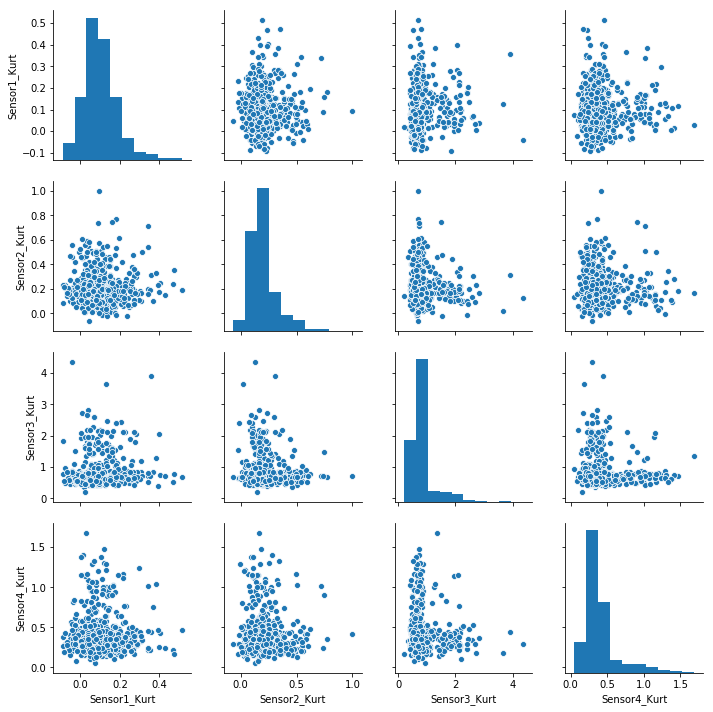

In [226]:
## visualize the new features
sns.pairplot(data[['Sensor1_Kurt','Sensor2_Kurt','Sensor3_Kurt', 'Sensor4_Kurt']])

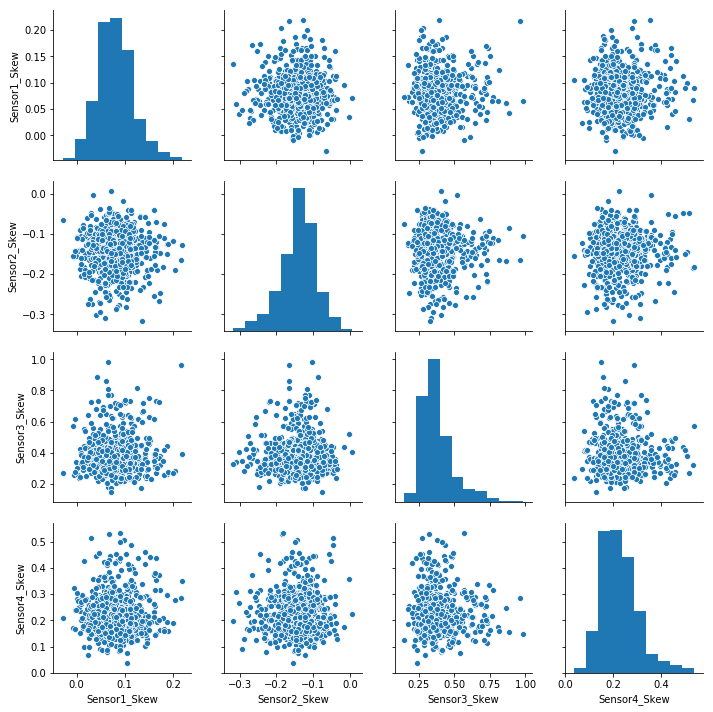

In [227]:
sns.pairplot(data[['Sensor1_Skew','Sensor2_Skew','Sensor3_Skew', 'Sensor4_Skew']])

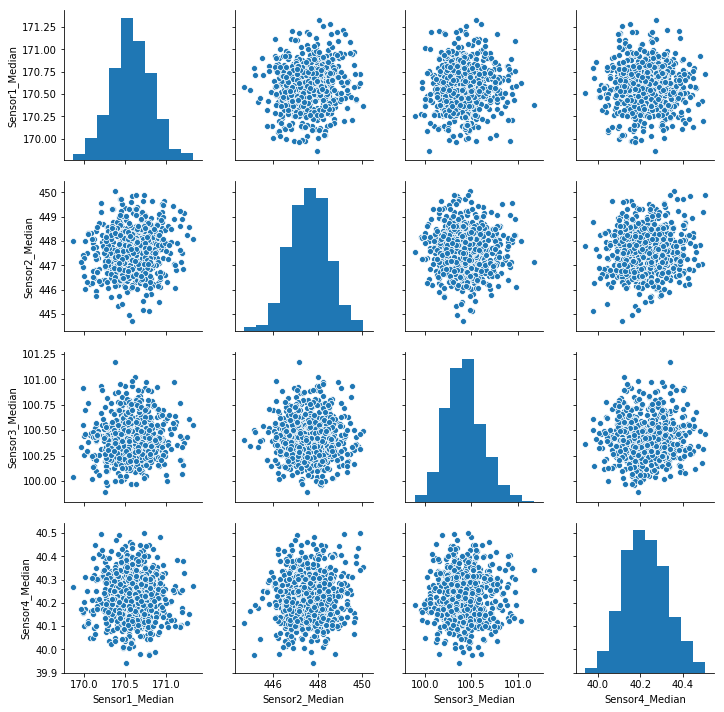

In [228]:
sns.pairplot(data[['Sensor1_Median','Sensor2_Median','Sensor3_Median', 'Sensor4_Median']])

In [229]:
data_vis = pd.concat([data,train_data['ActionPoint']],axis=1)

In [230]:
data_vis.columns

Index(['ServicePeriod', 'Sensor1_Mean', 'Sensor2_Mean', 'Sensor3_Mean',
       'Sensor4_Mean', 'Sensor1_Min', 'Sensor2_Min', 'Sensor3_Min',
       'Sensor4_Min', 'Sensor1_Max', 'Sensor2_Max', 'Sensor3_Max',
       'Sensor4_Max', 'Sensor1_Median', 'Sensor2_Median', 'Sensor3_Median',
       'Sensor4_Median', 'Sensor1_Std', 'Sensor2_Std', 'Sensor3_Std',
       'Sensor4_Std', 'Sensor1_Skew', 'Sensor2_Skew', 'Sensor3_Skew',
       'Sensor4_Skew', 'Sensor1_Kurt', 'Sensor2_Kurt', 'Sensor3_Kurt',
       'Sensor4_Kurt', 'Error1', 'Error2', 'Error3', 'Error4', 'Error5',
       'ComponentReplaced1', 'ComponentReplaced2', 'ComponentReplaced3',
       'ComponentReplaced4', 'ComponentAttended1', 'ComponentAttended2',
       'ComponentAttended3', 'ComponentAttended4', 'ComponentRepair',
       'ScheduledService', 'LastComplainDays', 'LastCompReplaceDays',
       'LastComplainServiceDays', 'MachineModelPattern',
       'ServicePeriodPattern', 'MachineModel_model1', 'MachineModel_model2',
       'Machi

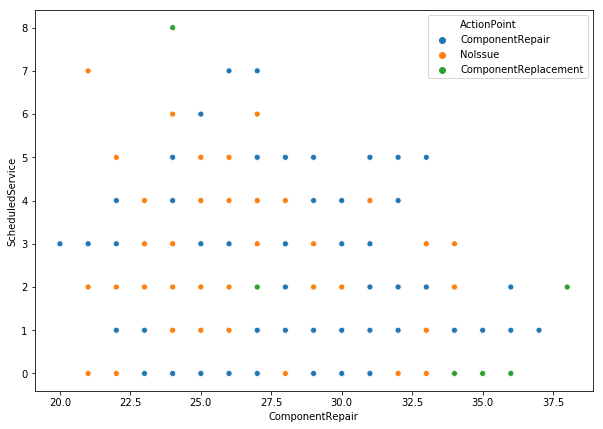

In [231]:
## draw Component Repair against ServiceType and target
plt.figure(figsize=(10,7))
sns.scatterplot(x="ComponentRepair", y="ScheduledService", data=data_vis,hue='ActionPoint')

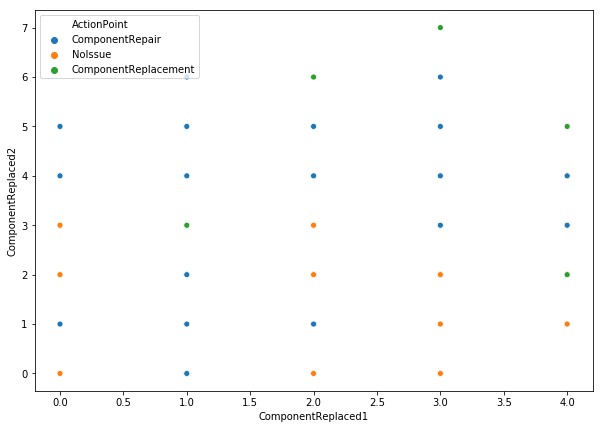

In [232]:
plt.figure(figsize=(10,7))
sns.scatterplot(x="ComponentReplaced1", y="ComponentReplaced2", data=data_vis,hue='ActionPoint')

<Figure size 720x504 with 0 Axes>

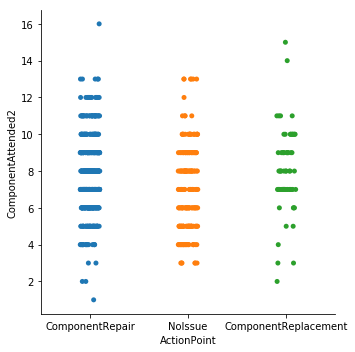

In [233]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="ComponentAttended2", data=data_vis);

<Figure size 720x504 with 0 Axes>

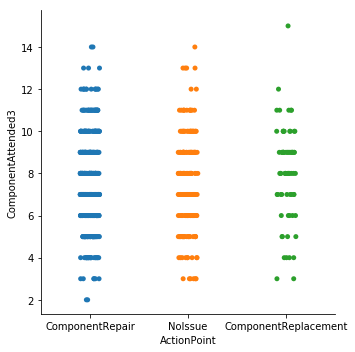

In [234]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="ComponentAttended3", data=data_vis);

<Figure size 720x504 with 0 Axes>

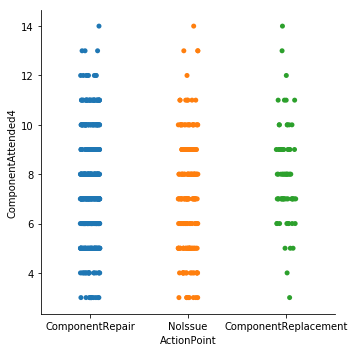

In [235]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="ComponentAttended4", data=data_vis);

<Figure size 720x504 with 0 Axes>

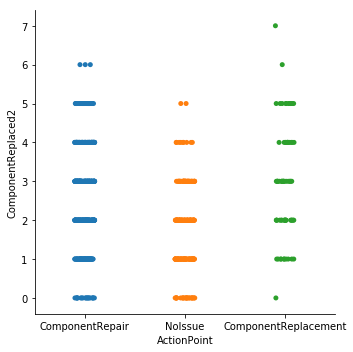

In [236]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="ComponentReplaced2", data=data_vis);

<Figure size 720x504 with 0 Axes>

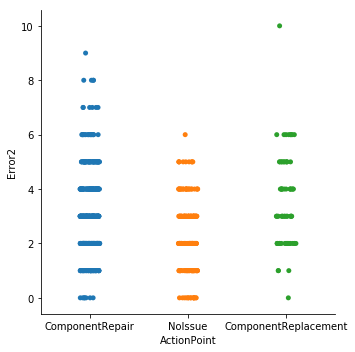

In [237]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="Error2", data=data_vis);

<Figure size 720x504 with 0 Axes>

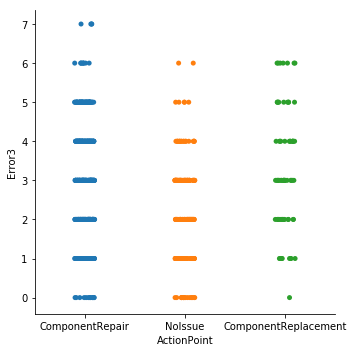

In [238]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="Error3", data=data_vis);

<Figure size 720x504 with 0 Axes>

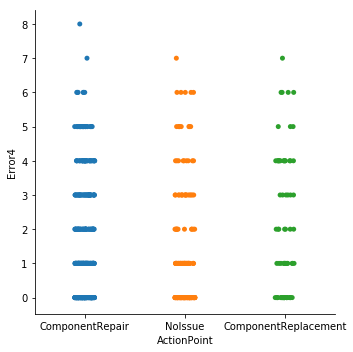

In [239]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="Error4", data=data_vis);

<Figure size 720x504 with 0 Axes>

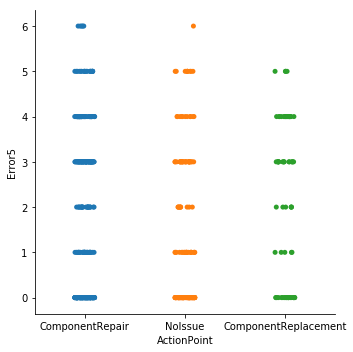

In [240]:
plt.figure(figsize=(10,7))
sns.catplot(x="ActionPoint", y="Error5", data=data_vis);

In [243]:
## stacking Naive Bayes, Logistic, Decision Trees, SVM, Perceptron
data_stacking=pd.concat([pd.DataFrame(predictions_nb),pd.DataFrame(predictions_lg)
                         ,pd.DataFrame(predictions_dt),pd.DataFrame(predictions_svm)
                         ,pd.DataFrame(predictions_percepton)],axis=1,ignore_index=True)

In [244]:
data_stacking.columns=['NB','LG','DT','SVM','PT']

In [245]:
print(data_stacking.shape)
print(len(labels))

(674, 5)
674


In [246]:
## split inot train and test
x_train, x_test, y_train, y_test = train_test_split(data_stacking, labels, test_size=0.4, random_state=786,stratify=labels)

In [ ]:
## do the same for test data
## round 1, generate test predictions using individual classifier
test_data_sub1= test_data_sub.drop(['MachineID'],axis=1)

In [ ]:
test_data_nb = model_NB.predict(test_data_sub1)
test_data_lg = logreg.predict(test_data_sub1)
test_data_dt = decisiontree_model.predict(test_data_sub1)
test_data_svm = svm_model.predict(test_data_sub1)
test_data_sub_std = sc.transform(test_data_sub1)
test_data_percep = perceptron_model.predict(test_data_sub_std)

In [ ]:
## stacking Naive Bayes, Logistic, Decision Trees, SVM, Perceptron
data_stacking_test=pd.concat([pd.DataFrame(test_data_nb),pd.DataFrame(test_data_lg)
                         ,pd.DataFrame(test_data_dt),pd.DataFrame(test_data_svm)
                         ,pd.DataFrame(test_data_percep)],axis=1,ignore_index=True)

data_stacking_test.columns=['NB','LG','DT','SVM','PT']

In [247]:
randomforest_model_stack = RandomForestClassifier(n_estimators=5, criterion='entropy', max_depth=4, n_jobs=-1, random_state=786
                                            ,class_weight='balanced',verbose=0)    
randomforest_model_stack.fit(x_train,y_train)

RandomForestClassifier(bootstrap=True, class_weight='balanced',
            criterion='entropy', max_depth=4, max_features='auto',
            max_leaf_nodes=None, min_impurity_decrease=0.0,
            min_impurity_split=None, min_samples_leaf=1,
            min_samples_split=2, min_weight_fraction_leaf=0.0,
            n_estimators=5, n_jobs=-1, oob_score=False, random_state=786,
            verbose=0, warm_start=False)

In [248]:
## check accuracy and confusion matrix
train_accuracy= randomforest_model_stack.score(x_train,y_train)
test_accuracy= randomforest_model_stack.score(x_test,y_test)
print(train_accuracy)
print(test_accuracy)
predictions = randomforest_model_stack.predict(x_test)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))  

0.8663366336633663
0.6481481481481481
[[98 47 20]
 [19 57  1]
 [ 5  3 20]]
             precision    recall  f1-score   support

          0       0.80      0.59      0.68       165
          1       0.53      0.74      0.62        77
          2       0.49      0.71      0.58        28

avg / total       0.69      0.65      0.65       270



In [ ]:
predictions_test = randomforest_model_stack.predict(data_stacking_test)
target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue', 2: 'ComponentReplacement'}
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test]
stack_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
stack_sub_df.columns = ['MachineID','ActionPoint']
stack_sub_df.to_csv('Stacking_DT4.csv')

In [374]:
data_svm = data.drop(['ServicePeriodPattern','MachineModelPattern'],axis=1)

In [375]:
x_train, x_test, y_train, y_test = train_test_split(data_svm , labels, test_size=0.4, random_state=786, stratify=train_data['ActionPoint'])

In [376]:
svm_model = SVC(C=5, kernel='linear', class_weight={0:1,1:0.5,2:5}, verbose=False, random_state=786)
svm_model.fit(x_train,y_train)

SVC(C=5, cache_size=200, class_weight={0: 1, 1: 0.5, 2: 5}, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=786, shrinking=True,
  tol=0.001, verbose=False)

In [377]:
train_accuracy= svm_model.score(x_train,y_train)
test_accuracy= svm_model.score(x_test,y_test)
predictions=svm_model.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(predictions,y_test))

0.6485148514851485
0.5296296296296297
[[118  17  30]
 [ 57  13   7]
 [ 14   2  12]]
             precision    recall  f1-score   support

          0       0.72      0.62      0.67       189
          1       0.17      0.41      0.24        32
          2       0.43      0.24      0.31        49

avg / total       0.60      0.53      0.55       270



In [378]:
#test_data_sub1= test_data_sub.drop(['MachineID','ServicePeriodPattern','MachineModelPattern'],axis=1)
predictions_test = svm_model.predict(test_data_sub1)
## write to file
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test]
rf_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
rf_sub_df.columns = ['MachineID','ActionPoint']
rf_sub_df.to_csv('svm_model_sub.csv')

In [251]:
## do one vs all binary classifier
print(data.shape)
print(len(labels))

(674, 53)
674


In [252]:
data_model_build.head(4)

,MachineID,ServicePeriod,Sensor1_Mean,Sensor2_Mean,Sensor3_Mean,Sensor4_Mean,Sensor1_Min,Sensor2_Min,Sensor3_Min,Sensor4_Min,...,LastComplainDays,LastCompReplaceDays,LastComplainServiceDays,MachineModelPattern,ServicePeriodPattern,MachineModel_model1,MachineModel_model2,MachineModel_model3,MachineModel_model4,ActionPoint
0,MID11001,21,171.262523,444.775762,100.875820,40.334566,113.8054,217.3352,61.86010,21.21610,...,337,336,306,0,0,0,0,0,1,ComponentRepair
1,MID11002,21,170.379495,445.792017,101.038739,40.488806,108.4282,208.6680,62.02004,21.12041,...,304,318,318,0,0,1,0,0,0,ComponentRepair
2,MID11003,22,170.772571,446.157868,100.597294,40.544088,111.5735,244.5145,51.25404,21.24516,...,323,322,307,0,0,0,0,1,0,NoIssue
3,MID11004,22,170.736873,445.821679,100.783941,40.585260,111.2657,238.9340,61.18749,22.79354,...,308,307,307,0,0,0,0,0,1,NoIssue


In [253]:
data_final = data_model_build.drop(['ServicePeriodPattern','MachineModelPattern'], axis=1)

In [254]:
data_final['ActionPoint'].value_counts()

ComponentRepair         413
NoIssue                 191
ComponentReplacement     70
Name: ActionPoint, dtype: int64

In [269]:
data_final['LastComplainDays'] = data_final['LastComplainDays'].astype(int)
data_final['LastCompReplaceDays'] = data_final['LastCompReplaceDays'].astype(int)
data_final['LastComplainServiceDays'] = data_final['LastComplainServiceDays'].astype(int)

In [270]:
## build a classifier for predictiing Component Repair and ComponentReplacement
data_Repair_replacement = data_final[(data_final['ActionPoint']=='ComponentRepair') | (data_final['ActionPoint']=='ComponentReplacement')]

In [271]:
data_Repair_replacement['ActionPoint'].value_counts()

ComponentRepair         413
ComponentReplacement     70
Name: ActionPoint, dtype: int64

In [272]:
labels_rep_replace=data_Repair_replacement['ActionPoint']

In [273]:
data_val_rep_repl = data_Repair_replacement.drop(['MachineID','ActionPoint'], axis=1)

In [274]:
data_Repair_replacement =data_Repair_replacement.reset_index(drop=True)

In [275]:
labels_rep_replace_values=[0 if data_Repair_replacement['ActionPoint'][i]=='ComponentRepair' else 1 for i in range(0,data_Repair_replacement.shape[0])]

In [276]:
## separate train and test
x_train, x_test, y_train, y_test = train_test_split(data_val_rep_repl, labels_rep_replace_values, test_size=0.2, random_state=786,stratify=labels_rep_replace_values)

In [277]:
## create decision trees
decisiontree_model = tree.DecisionTreeClassifier(criterion='gini',class_weight='balanced',random_state=786, max_depth=6)
decisiontree_model.fit(x_train,y_train)
train_accuracy= decisiontree_model.score(x_train,y_train)
test_accuracy= decisiontree_model.score(x_test,y_test)
predictions=decisiontree_model.predict(x_test)
print(classification_report(y_test, predictions))
#predictions_dt=decisiontree_model.predict(data)

             precision    recall  f1-score   support

          0       0.85      0.66      0.74        83
          1       0.12      0.29      0.17        14

avg / total       0.74      0.61      0.66        97



In [278]:
## use smote
## try class balancing using SMOTE
os = SMOTE(random_state=0, ratio={0:350, 1:220})
os_data_X,os_data_y=os.fit_sample(x_train,y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=x_train.columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=["ActionPoint"])

In [279]:
decisiontree_model = tree.DecisionTreeClassifier(criterion='gini',random_state=786, max_depth=6)
decisiontree_model.fit(os_data_X,os_data_y)
train_accuracy= decisiontree_model.score(os_data_X,os_data_y)
test_accuracy= decisiontree_model.score(x_test,y_test)
predictions=decisiontree_model.predict(x_test)
print(classification_report(y_test, predictions))

             precision    recall  f1-score   support

          0       0.90      0.89      0.90        83
          1       0.40      0.43      0.41        14

avg / total       0.83      0.82      0.83        97



In [280]:
model_rf_bin1= RandomForestClassifier(n_estimators=5, criterion='gini', max_depth=8, n_jobs=-1,
                                       random_state=786)
model_rf_bin1.fit(os_data_X,os_data_y)
train_accuracy= model_rf_bin1.score(os_data_X,os_data_y)
test_accuracy= model_rf_bin1.score(x_test,y_test)
predictions=model_rf_bin1.predict(x_test)
print(classification_report(y_test, predictions))

             precision    recall  f1-score   support

          0       0.90      0.89      0.90        83
          1       0.40      0.43      0.41        14

avg / total       0.83      0.82      0.83        97



In [281]:
svm_model = SVC(C=10, kernel='linear', verbose=False, random_state=786)
svm_model.fit(os_data_X,os_data_y)

SVC(C=10, cache_size=200, class_weight=None, coef0=0.0,
  decision_function_shape='ovr', degree=3, gamma='auto', kernel='linear',
  max_iter=-1, probability=False, random_state=786, shrinking=True,
  tol=0.001, verbose=False)

In [282]:
train_accuracy= svm_model.score(os_data_X,os_data_y)
test_accuracy= svm_model.score(x_test,y_test)
print(train_accuracy)
print(test_accuracy)
predictions=svm_model.predict(x_test)
print(classification_report(y_test, predictions))

0.7807017543859649
0.6804123711340206
             precision    recall  f1-score   support

          0       0.87      0.73      0.80        83
          1       0.19      0.36      0.24        14

avg / total       0.77      0.68      0.72        97



In [283]:
xg_reg = xgb.XGBClassifier(booster='gbtree',objective ='binary:logistic', colsample_bytree = 0.3, learning_rate = 0.01,
                max_depth = 5, alpha = 5, n_estimators = 20, metrics='accuracy ', class_weight='balanced',verbose=0)
xg_reg.fit(x_train,y_train)
train_accuracy= xg_reg.score(os_data_X,os_data_y)
test_accuracy= xg_reg.score(x_test,y_test)
print(train_accuracy)
print(test_accuracy)
predictions=xg_reg.predict(x_test)
print(classification_report(y_test, predictions))

0.656140350877193
0.8556701030927835
             precision    recall  f1-score   support

          0       0.86      1.00      0.92        83
          1       0.00      0.00      0.00        14

avg / total       0.73      0.86      0.79        97



In [284]:
## take component Replacement and No issue
data_Issue_replacement = data_final[(data_final['ActionPoint']=='NoIssue') | (data_final['ActionPoint']=='ComponentReplacement')]

In [285]:
labels_issue_replace=data_Issue_replacement['ActionPoint']
data_val_issue_repl = data_Issue_replacement.drop(['MachineID','ActionPoint'], axis=1)
data_Issue_replacement =data_Issue_replacement.reset_index(drop=True)
labels_issue_replace_values=[0 if data_Issue_replacement['ActionPoint'][i]=='NoIssue' else 1 for i in range(0,data_Issue_replacement.shape[0])]
print(data_val_issue_repl.shape)
print(len(labels_issue_replace_values))
## separate train and test
x_train, x_test, y_train, y_test = train_test_split(data_val_issue_repl, labels_issue_replace_values, test_size=0.4, random_state=786,stratify= labels_issue_replace_values)

(261, 51)
261


In [286]:
## try class balancing using SMOTE
os = SMOTE(random_state=0, ratio={0:1000, 1:500})
os_data_X,os_data_y=os.fit_sample(x_train,y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=x_train.columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=["ActionPoint"])

In [287]:
decisiontree_model = tree.DecisionTreeClassifier(criterion='gini',random_state=786, max_depth=6)
decisiontree_model.fit(os_data_X,os_data_y)
train_accuracy= decisiontree_model.score(x_train,y_train)
test_accuracy= decisiontree_model.score(x_test,y_test)
predictions=decisiontree_model.predict(x_test)
print(classification_report(y_test, predictions))

             precision    recall  f1-score   support

          0       0.89      0.82      0.85        77
          1       0.59      0.71      0.65        28

avg / total       0.81      0.79      0.80       105



In [288]:
## predict in the test sample
test_data_sub2 = test_data_sub1.drop(['MachineModelPattern','ServicePeriodPattern'],axis=1)

In [289]:
#run the predictions
predictions_test_1= decisiontree_model.predict(test_data_sub2)

In [290]:
predictions_test_1

array([1, 0, 0, 1, 1, 0, 1, 0, 0, 0, 0, 0, 1, 0, 0, 1, 1, 0, 1, 1, 0, 0,
       0, 1, 0, 1, 1, 0, 1, 0, 0, 0, 1, 0, 0, 0, 0, 1, 1, 0, 1, 0, 0, 0,
       1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 0,
       1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 1,
       1, 0, 0, 0, 0, 1, 1, 1, 0, 0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0,
       0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0, 1,
       0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 1,
       1, 1, 1, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       0, 1, 1, 1, 0, 0, 0, 0, 0, 1, 1, 0, 0, 1, 1, 0, 0, 1, 1, 1, 0, 0,
       0, 0, 1, 1, 0, 1, 0, 1, 1, 0, 0, 0, 1, 1, 0, 0, 1, 0, 0, 0, 1, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 1, 0, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1,
       0, 1, 0, 0, 0, 0, 1, 0, 1, 0, 0, 0, 0, 0, 0, 0, 1, 0, 1, 0, 1, 0,
       0, 1, 0, 0, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0,

In [291]:
#target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue', 2: 'ComponentReplacement'}
target_dict_inv = { 0:'NoIssue', 1: 'ComponentReplacement'}
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test_1]
rf_sub_df = pd.concat([test_data_sub['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
rf_sub_df.columns = ['MachineID','ActionPoint']
#rf_sub_df.to_csv('ComponentReplacement_PC.csv')

In [292]:
## take the 'NoIssue' ones and see ifthey are No Issue or ComponentRepair
data_no_issue = rf_sub_df[(rf_sub_df['ActionPoint']=='NoIssue')]

In [293]:
MachineIDs_noissue = data_no_issue['MachineID']

In [294]:
test_data_sub_noissue = test_data_sub[test_data_sub['MachineID'].isin(MachineIDs_noissue)]

In [295]:
test_data_sub_noissue=test_data_sub_noissue.reset_index(drop=True)

In [296]:
## train binary classifier on comp replacement and comp repair
data_Repair_noissue = data_final[(data_final['ActionPoint']=='ComponentRepair') | (data_final['ActionPoint']=='NoIssue')]

In [297]:
data_Repair_noissue['ActionPoint'].value_counts()

ComponentRepair    413
NoIssue            191
Name: ActionPoint, dtype: int64

In [298]:
data_Repair_noissue=data_Repair_noissue.reset_index(drop=True)

In [299]:
labels_rep_replace=data_Repair_noissue['ActionPoint']
data_val_rep_repl = data_Repair_noissue.drop(['MachineID','ActionPoint'], axis=1)
labels_rep_replace_values=[0 if data_Repair_noissue['ActionPoint'][i]=='ComponentRepair' else 1 for i in range(0,data_Repair_noissue.shape[0])]
## separate train and test
x_train, x_test, y_train, y_test = train_test_split(data_val_rep_repl, labels_rep_replace_values, test_size=0.4, random_state=786,stratify=labels_rep_replace_values)

In [300]:
## try class balancing using SMOTE
os = SMOTE(random_state=0, ratio={0:1000, 1:1000})
os_data_X,os_data_y=os.fit_sample(x_train,y_train)
os_data_X = pd.DataFrame(data=os_data_X,columns=x_train.columns )
os_data_y= pd.DataFrame(data=os_data_y,columns=["ActionPoint"])

In [301]:
decisiontree_model = tree.DecisionTreeClassifier(criterion='gini',random_state=786, max_depth=6)
decisiontree_model.fit(os_data_X,os_data_y)
train_accuracy= decisiontree_model.score(x_train,y_train)
test_accuracy= decisiontree_model.score(x_test,y_test)
predictions=decisiontree_model.predict(x_test)
print(train_accuracy)
print(test_accuracy)
print(classification_report(y_test, predictions))

0.8425414364640884
0.6652892561983471
             precision    recall  f1-score   support

          0       0.78      0.72      0.74       165
          1       0.48      0.56      0.51        77

avg / total       0.68      0.67      0.67       242



In [302]:
test_data_sub_noissue_wo_MID= test_data_sub_noissue.drop(['MachineID','MachineModelPattern','ServicePeriodPattern'],axis=1)

In [303]:
predictions_test_2 = decisiontree_model.predict(test_data_sub_noissue_wo_MID)

In [304]:
predictions_test_2

array([0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1,
       0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 0, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       0, 0, 1, 0, 0, 1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0,
       0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 0,
       0, 1, 0, 1, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 0, 0, 0, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 0, 1, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 0, 1, 0,
       1, 1, 0, 0, 1, 0, 1, 1, 1, 0, 0, 1, 0, 1, 1, 0, 1, 1, 0, 0, 0, 0,
       1, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 0, 1, 0, 1, 1, 0, 0, 1, 0, 1, 1,
       1, 0, 0, 1, 1, 0, 1, 1, 0, 0, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 0, 1,
       0, 1, 0, 0, 1, 0, 1, 0, 0, 1, 0, 0, 1, 1, 1, 1, 0, 1, 0])

In [305]:
target_dict_inv = { 0:'ComponentRepair' , 1:'NoIssue'}
predictions_test_values = [target_dict_inv.get(i) for i in predictions_test_2]
rf_sub_df_1 = pd.concat([test_data_sub_noissue['MachineID'],pd.DataFrame(predictions_test_values)],axis=1,ignore_index=True)
rf_sub_df_1.columns = ['MachineID','ActionPoint']
#rf_sub_df_1.to_csv('NoIssue_PC.csv')

In [306]:
rf_sub_df_drop = rf_sub_df[(rf_sub_df['ActionPoint']=='ComponentReplacement')]

In [307]:
rf_sub_df_drop = rf_sub_df_drop.reset_index(drop=True)

In [308]:
final_test_sub_pc= pd.concat([rf_sub_df_drop,rf_sub_df_1], axis=0)

In [309]:
test_pc_1 = final_test_sub_pc.sort_values(['MachineID'])

In [310]:
test_pc_1.to_csv('Data_Submission_PC.csv',index=False)

In [311]:
test_pc_1.head(4)

,MachineID,ActionPoint
0,MID11006,ComponentReplacement
0,MID11007,ComponentRepair
1,MID11039,ComponentRepair
1,MID11045,ComponentReplacement


In [312]:
## do PCA and take top 30
data_pca = pd.DataFrame(MinMaxScaler().fit_transform(data),columns=data.columns)

In [313]:
## create a list of 20 PCA components, try kernel pca also
pca_list=['PCA_{0}'.format(i+1) for i in range(0,30)]

In [314]:
print(pca_list)

['PCA_1', 'PCA_2', 'PCA_3', 'PCA_4', 'PCA_5', 'PCA_6', 'PCA_7', 'PCA_8', 'PCA_9', 'PCA_10', 'PCA_11', 'PCA_12', 'PCA_13', 'PCA_14', 'PCA_15', 'PCA_16', 'PCA_17', 'PCA_18', 'PCA_19', 'PCA_20', 'PCA_21', 'PCA_22', 'PCA_23', 'PCA_24', 'PCA_25', 'PCA_26', 'PCA_27', 'PCA_28', 'PCA_29', 'PCA_30']


In [315]:
pca_model = PCA(n_components=30)
principalComponents = pca_model.fit_transform(data_pca)
pca_data_frame = pd.DataFrame(data = principalComponents
             , columns = pca_list)

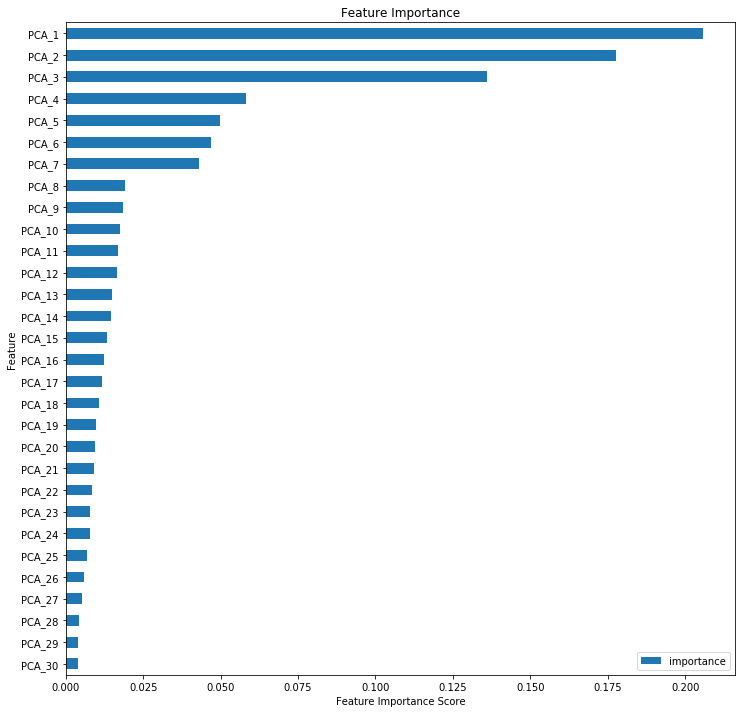

In [316]:
feat_imp = pd.DataFrame({'importance':pca_model.explained_variance_ratio_})    
feat_imp['Feature'] = pca_list
feat_imp.sort_values(by='importance', ascending=False, inplace=True)
#feat_imp = feat_imp.iloc[:top_n]
feat_imp.sort_values(by='importance', inplace=True)
feat_imp = feat_imp.set_index('Feature', drop=True)
feat_imp.plot.barh(title='Feature Importance', figsize=(12,12))
plt.xlabel('Feature Importance Score')
plt.show()

In [317]:
pca_data_frame.head(4)

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10,...,PCA_21,PCA_22,PCA_23,PCA_24,PCA_25,PCA_26,PCA_27,PCA_28,PCA_29,PCA_30
0,-0.173281,0.598285,0.740599,-1.003154,0.670657,0.294383,0.333108,-0.075701,0.411619,-0.074383,...,0.115373,-0.157748,-0.027334,0.046235,0.150356,-0.100584,-0.149248,-0.047575,-0.167926,-0.044026
1,0.334790,0.762574,-0.026522,0.793811,0.121785,0.836816,-0.676573,0.091007,0.336390,0.476348,...,0.005108,0.195997,0.159633,-0.055692,-0.248057,0.180549,-0.241704,-0.061573,-0.098035,0.044184
2,-0.533998,0.680082,-0.669670,-0.130875,0.034984,-0.049648,-0.072808,0.269834,0.155311,-0.051087,...,0.018465,0.070293,-0.047167,-0.280860,-0.061392,-0.033325,-0.124720,0.020685,-0.178813,0.043973
3,-0.211948,1.101846,0.707877,-0.197012,0.012163,-0.003973,-0.194799,0.013913,0.213647,-0.076348,...,-0.093012,0.177833,-0.174033,0.051888,-0.082418,0.022998,0.054598,0.266432,-0.107052,0.124251


In [318]:
print(pca_data_frame.shape)
print(len(labels))

(674, 30)
674


In [319]:
pca_data_frame_1 = pca_data_frame.iloc[:,0:10]

In [320]:
pca_data_frame_1.head(4)

,PCA_1,PCA_2,PCA_3,PCA_4,PCA_5,PCA_6,PCA_7,PCA_8,PCA_9,PCA_10
0,-0.173281,0.598285,0.740599,-1.003154,0.670657,0.294383,0.333108,-0.075701,0.411619,-0.074383
1,0.334790,0.762574,-0.026522,0.793811,0.121785,0.836816,-0.676573,0.091007,0.336390,0.476348
2,-0.533998,0.680082,-0.669670,-0.130875,0.034984,-0.049648,-0.072808,0.269834,0.155311,-0.051087
3,-0.211948,1.101846,0.707877,-0.197012,0.012163,-0.003973,-0.194799,0.013913,0.213647,-0.076348


In [321]:
data_plot_pca = pd.concat([pca_data_frame_1,target],axis=1)

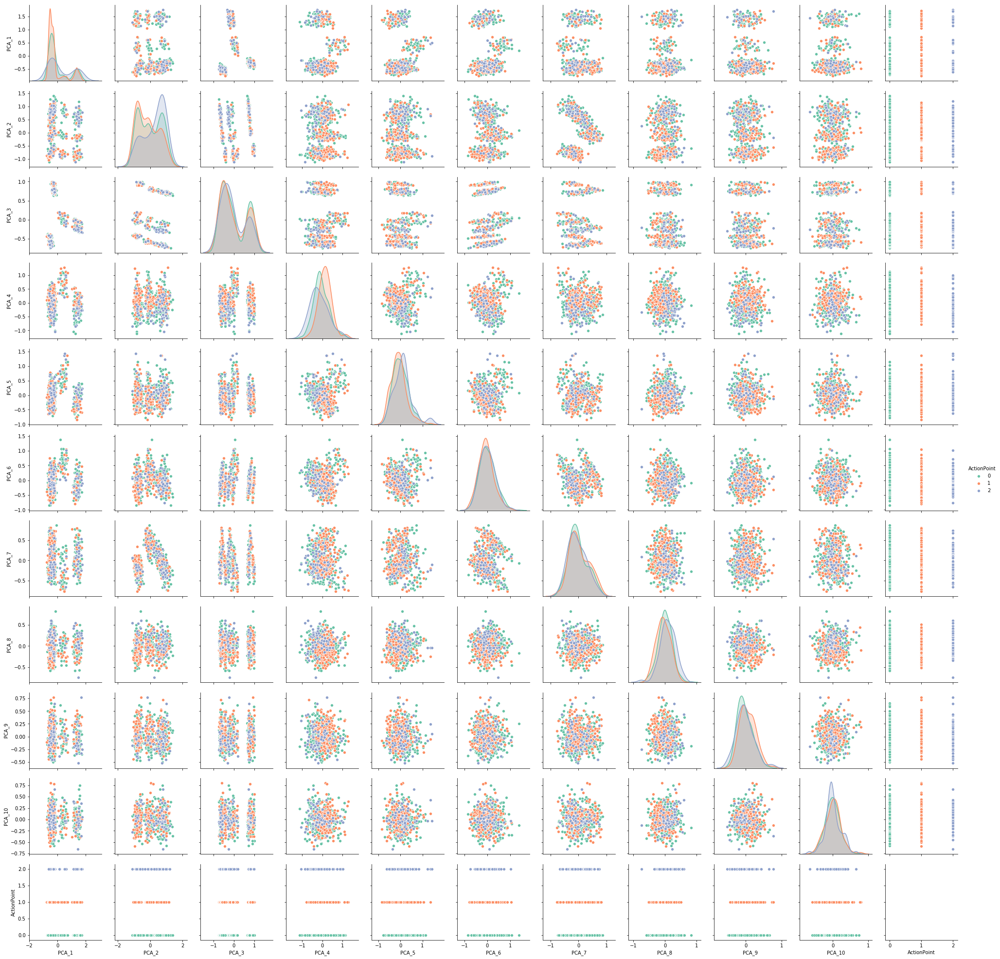

In [322]:
g = sns.pairplot(data_plot_pca, hue="ActionPoint", palette="Set2", diag_kind="kde", height=2.5)

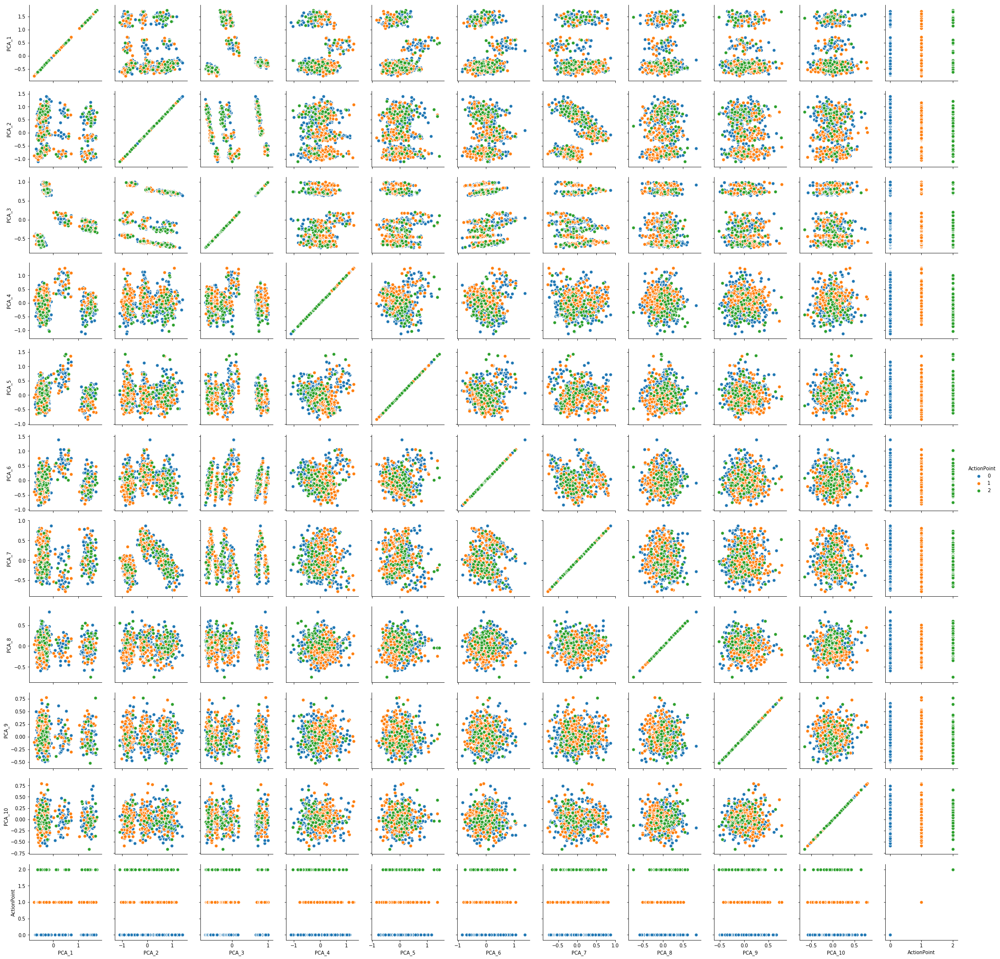

In [323]:
g = sns.PairGrid(data_plot_pca, hue="ActionPoint")
g.map(plt.scatter, s=50, edgecolor="white")
g.add_legend();

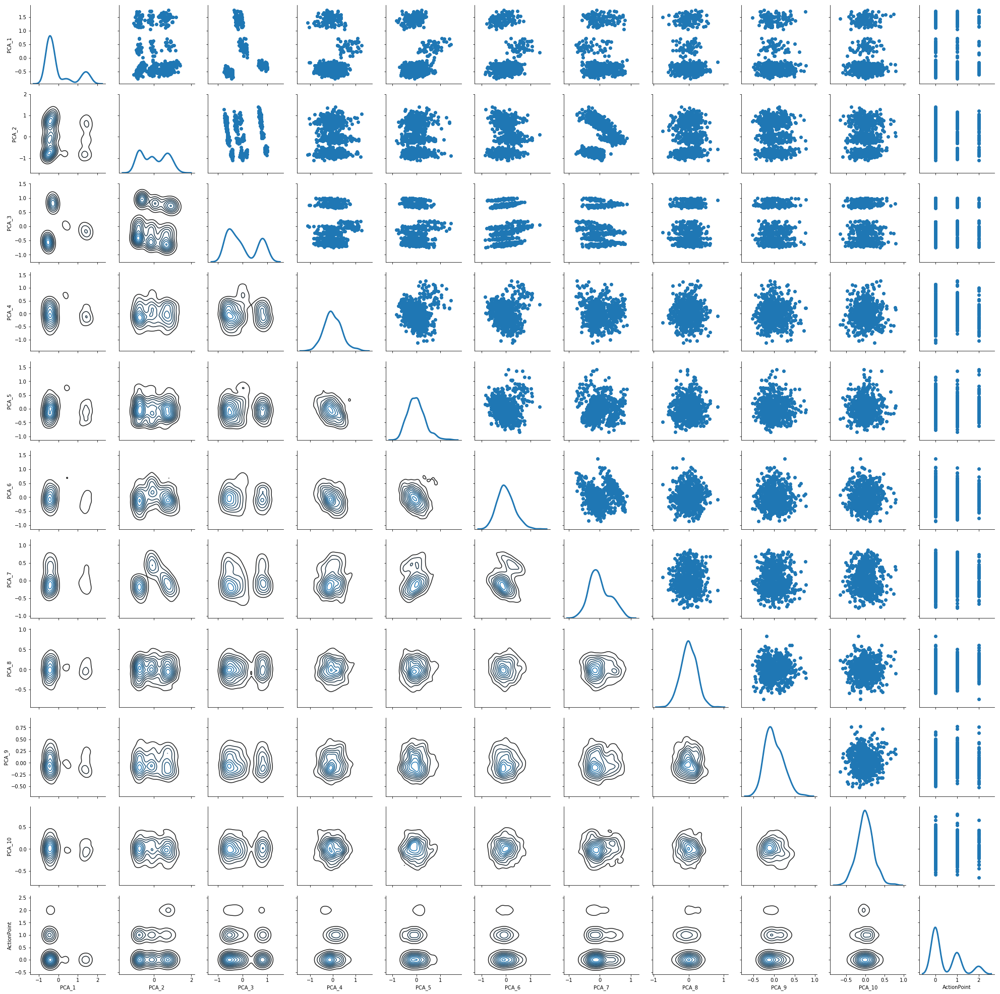

In [324]:
g = sns.PairGrid(data_plot_pca)
g.map_upper(plt.scatter)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False);

In [325]:
##split train and test 
x_train, x_test, y_train, y_test = train_test_split(pca_data_frame_1, labels, test_size=0.4, random_state=786, stratify=labels)

In [326]:
decisiontree_model_pca = tree.DecisionTreeClassifier(criterion='gini',class_weight='balanced',random_state=1234, max_depth=8)
decisiontree_model_pca.fit(x_train,y_train)
train_accuracy= decisiontree_model_pca.score(x_train,y_train)
test_accuracy= decisiontree_model_pca.score(x_test,y_test)
predictions=decisiontree_model_pca.predict(x_test)
print(train_accuracy)
print(test_accuracy)
print(classification_report(y_test, predictions))

0.8316831683168316
0.44814814814814813
             precision    recall  f1-score   support

          0       0.60      0.41      0.48       165
          1       0.41      0.64      0.50        77
          2       0.13      0.18      0.15        28

avg / total       0.50      0.45      0.45       270



In [327]:
model_NB_pca = GaussianNB()
model_NB_pca.fit(x_train,y_train)
train_accuracy= model_NB_pca.score(x_train,y_train)
test_accuracy= model_NB_pca.score(x_test,y_test)
predictions=model_NB_pca.predict(x_test)
print(train_accuracy)
print(test_accuracy)
confusionMatrix = confusion_matrix(y_pred=predictions,y_true=y_test)
print(confusionMatrix)
print(classification_report(y_test, predictions))

0.650990099009901
0.6148148148148148
[[141  24   0]
 [ 55  22   0]
 [ 24   1   3]]
             precision    recall  f1-score   support

          0       0.64      0.85      0.73       165
          1       0.47      0.29      0.35        77
          2       1.00      0.11      0.19        28

avg / total       0.63      0.61      0.57       270



In [329]:
## try with SVM
svm_model_pca = SVC(C=10, kernel='linear', class_weight={0:1,1:1,2:5}, verbose=False, random_state=786)
svm_model_pca.fit(x_train,y_train)
predictions = svm_model_pca.predict(x_test)
print('Accuracy of SVM on train set: {:.2f}'.format(svm_model_pca.score(x_train, y_train)))
print('Accuracy of SVM on test set: {:.2f}'.format(svm_model_pca.score(x_test, y_test)))
confmatrix = confusion_matrix(y_test,predictions)
print(confmatrix)
print(classification_report(y_test, predictions))

Accuracy of SVM on train set: 0.50
Accuracy of SVM on test set: 0.53
[[109  13  43]
 [ 59  15   3]
 [  9   1  18]]
             precision    recall  f1-score   support

          0       0.62      0.66      0.64       165
          1       0.52      0.19      0.28        77
          2       0.28      0.64      0.39        28

avg / total       0.55      0.53      0.51       270



In [330]:
## try with autoencoding to extract features
data_autoEC = data_pca.copy()

In [336]:
data_autoEC.drop(['MachineModelPattern','ServicePeriodPattern'], axis=1, inplace=True)

In [337]:
from keras.layers import Input, Dense, Dropout
from keras.models import Model

In [338]:
labels_ = to_categorical(labels)

In [339]:
x_train, x_test, y_train, y_test = train_test_split(data_autoEC, labels_, test_size=0.4, random_state=42, stratify=labels)

In [340]:
input_data = Input(shape=(len(data_autoEC.columns),))
layer_1 = Dropout(0.2)(input_data)
# "encoded" is the encoded representation of the input
encoded = Dense(20, activation='relu')(layer_1)
# "decoded" is the lossy reconstruction of the input
decoded = Dense(51, activation='softmax')(encoded)
# this model maps an input to its reconstruction
autoencoder = Model(input_data, decoded)
# this model maps an input to its encoded representation
encoder = Model(input_data, encoded)

In [341]:
autoencoder.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 51)                0         
_________________________________________________________________
dropout_3 (Dropout)          (None, 51)                0         
_________________________________________________________________
dense_5 (Dense)              (None, 20)                1040      
_________________________________________________________________
dense_6 (Dense)              (None, 51)                1071      
Total params: 2,111
Trainable params: 2,111
Non-trainable params: 0
_________________________________________________________________


In [342]:
autoencoder.compile(optimizer='sgd', loss='categorical_crossentropy')

In [343]:
autoencoder.fit(x_train, x_train,
                epochs=100,
                batch_size=10,
                shuffle=True,
                validation_data=(x_test, x_test))

Train on 404 samples, validate on 270 samples
Epoch 1/100
404/404 [==============================] - 1s 2ms/step - loss: 75.2241 - val_loss: 74.4165
Epoch 2/100
404/404 [==============================] - 0s 478us/step - loss: 74.3739 - val_loss: 73.9005
Epoch 3/100
404/404 [==============================] - 0s 423us/step - loss: 74.0067 - val_loss: 73.6594
Epoch 4/100
404/404 [==============================] - 0s 332us/step - loss: 73.8312 - val_loss: 73.5507
Epoch 5/100
404/404 [==============================] - 0s 290us/step - loss: 73.7287 - val_loss: 73.4879
Epoch 6/100
404/404 [==============================] - 0s 312us/step - loss: 73.7005 - val_loss: 73.4292
Epoch 7/100
404/404 [==============================] - 0s 262us/step - loss: 73.6064 - val_loss: 73.3661
Epoch 8/100
404/404 [==============================] - 0s 267us/step - loss: 73.5529 - val_loss: 73.3038
Epoch 9/100
404/404 [==============================] - 0s 287us/step - loss: 73.5038 - val_loss: 73.2371
Epoch 10/10

Epoch 78/100
404/404 [==============================] - 0s 203us/step - loss: 71.9045 - val_loss: 71.5148
Epoch 79/100
404/404 [==============================] - 0s 203us/step - loss: 71.9239 - val_loss: 71.4978
Epoch 80/100
404/404 [==============================] - 0s 208us/step - loss: 71.8937 - val_loss: 71.4967
Epoch 81/100
404/404 [==============================] - 0s 203us/step - loss: 71.9050 - val_loss: 71.4934
Epoch 82/100
404/404 [==============================] - 0s 215us/step - loss: 71.8736 - val_loss: 71.4919
Epoch 83/100
404/404 [==============================] - 0s 218us/step - loss: 71.8985 - val_loss: 71.4803
Epoch 84/100
404/404 [==============================] - 0s 198us/step - loss: 71.8487 - val_loss: 71.4809
Epoch 85/100
404/404 [==============================] - 0s 198us/step - loss: 71.8841 - val_loss: 71.4770
Epoch 86/100
404/404 [==============================] - 0s 208us/step - loss: 71.9029 - val_loss: 71.4740
Epoch 87/100
404/404 [========================

In [344]:
#get the encoded features
encoded_features = encoder.predict(data_autoEC)

In [345]:
encoded_features.shape

(674, 20)

In [346]:
## create a list of 35 encoded components
encoded_list=['encoded_{0}'.format(i+1) for i in range(0,20)]
print(encoded_list)

['encoded_1', 'encoded_2', 'encoded_3', 'encoded_4', 'encoded_5', 'encoded_6', 'encoded_7', 'encoded_8', 'encoded_9', 'encoded_10', 'encoded_11', 'encoded_12', 'encoded_13', 'encoded_14', 'encoded_15', 'encoded_16', 'encoded_17', 'encoded_18', 'encoded_19', 'encoded_20']


In [347]:
encoded_df = pd.DataFrame(encoded_features, columns=encoded_list)

In [348]:
encoded_df.head(4)

,encoded_1,encoded_2,encoded_3,encoded_4,encoded_5,encoded_6,encoded_7,encoded_8,encoded_9,encoded_10,encoded_11,encoded_12,encoded_13,encoded_14,encoded_15,encoded_16,encoded_17,encoded_18,encoded_19,encoded_20
0,2.641608,0.0,0.015171,0.529696,1.130153,0.0,0.0,0.000000,0.0,0.0,0.745003,1.715316,0.0,0.0,0.0,0.000000,0.0,2.139192,0.516765,1.047031
1,0.807684,0.0,0.000000,0.000000,0.000000,0.0,0.0,1.300689,0.0,0.0,1.838116,0.752864,0.0,0.0,0.0,0.273408,0.0,0.000000,1.393830,0.256741
2,0.474347,0.0,0.654585,0.294247,1.873693,0.0,0.0,0.594070,0.0,0.0,1.901752,1.627833,0.0,0.0,0.0,0.000000,0.0,2.017858,0.226524,0.735804
3,2.511956,0.0,0.424315,0.206027,0.788470,0.0,0.0,0.583417,0.0,0.0,1.985340,1.242185,0.0,0.0,0.0,0.000000,0.0,1.805063,0.491016,0.588078


In [349]:
encoded_df.describe()

,encoded_1,encoded_2,encoded_3,encoded_4,encoded_5,encoded_6,encoded_7,encoded_8,encoded_9,encoded_10,encoded_11,encoded_12,encoded_13,encoded_14,encoded_15,encoded_16,encoded_17,encoded_18,encoded_19,encoded_20
count,674.000000,674.0,674.000000,674.000000,674.000000,674.0,674.0,674.000000,674.0,674.000000,674.000000,674.000000,674.0,674.0,674.000000,674.000000,674.0,674.000000,674.000000,674.000000
mean,1.030996,0.0,0.529741,0.536679,1.045056,0.0,0.0,0.590191,0.0,0.001364,1.151692,1.563434,0.0,0.0,0.000036,0.741189,0.0,1.438865,0.554134,0.867409
std,0.895899,0.0,0.276747,0.319736,0.751820,0.0,0.0,0.253071,0.0,0.014222,0.681266,0.518748,0.0,0.0,0.000928,0.621017,0.0,0.901573,0.426760,0.576343
min,0.000000,0.0,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.0,0.000000,0.020108,0.337776,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000
25%,0.318086,0.0,0.327662,0.304705,0.175316,0.0,0.0,0.423553,0.0,0.000000,0.605292,1.174362,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.246973,0.466090
50%,0.594551,0.0,0.523539,0.514121,1.047941,0.0,0.0,0.576013,0.0,0.000000,0.902992,1.572489,0.0,0.0,0.000000,0.880248,0.0,1.844210,0.440396,0.719271
75%,2.150216,0.0,0.732324,0.768539,1.751557,0.0,0.0,0.731611,0.0,0.000000,1.772240,1.921248,0.0,0.0,0.000000,1.237532,0.0,2.088186,0.764233,1.147454
max,2.852915,0.0,1.308522,1.457404,2.403893,0.0,0.0,1.645836,0.0,0.285583,3.064313,2.816730,0.0,0.0,0.024103,2.236604,0.0,2.658486,2.039808,2.592381


In [350]:
## remove the columns with no variance
encoded_df = encoded_df.drop(['encoded_2','encoded_6','encoded_7','encoded_9','encoded_13','encoded_14','encoded_17'],axis=1)

In [351]:
encoded_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 674 entries, 0 to 673
Data columns (total 13 columns):
encoded_1     674 non-null float32
encoded_3     674 non-null float32
encoded_4     674 non-null float32
encoded_5     674 non-null float32
encoded_8     674 non-null float32
encoded_10    674 non-null float32
encoded_11    674 non-null float32
encoded_12    674 non-null float32
encoded_15    674 non-null float32
encoded_16    674 non-null float32
encoded_18    674 non-null float32
encoded_19    674 non-null float32
encoded_20    674 non-null float32
dtypes: float32(13)
memory usage: 34.3 KB


In [240]:
target = pd.DataFrame(labels)
target.columns = ['ActionPoint']
data_plot= pd.concat([encoded_df,target],axis=1)

In [241]:
data_plot.head(4)

,encoded_1,encoded_2,encoded_3,encoded_4,encoded_5,encoded_6,encoded_7,encoded_8,encoded_9,encoded_10,encoded_14,encoded_18,ActionPoint
0,1.898879,0.0,2.863961,2.158572,1.798375,1.882940,1.417168,1.429162,0.552128,0.644641,2.248569,1.087209,0
1,0.000000,0.0,1.313184,0.851772,1.611264,0.629856,0.571584,0.000000,2.565289,0.000000,0.542666,1.926010,0
2,1.442469,0.0,0.702983,1.645765,1.438414,1.079134,1.014422,0.576679,1.620903,2.587174,1.304363,0.980186,1
3,1.605776,0.0,2.501971,0.925482,1.415653,1.181556,1.614979,0.435269,0.818294,0.607058,2.001546,0.957471,1


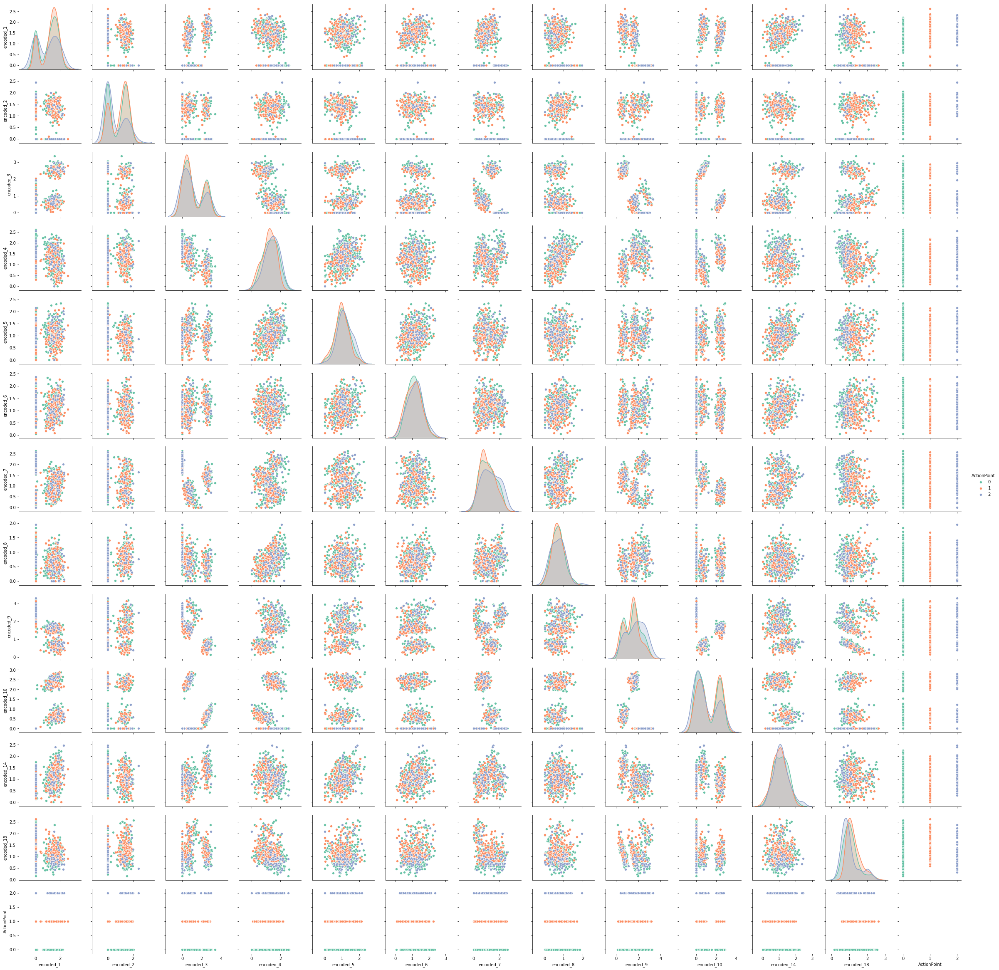

In [242]:
g = sns.pairplot(data_plot, hue="ActionPoint", palette="Set2", diag_kind="kde", height=2.5)

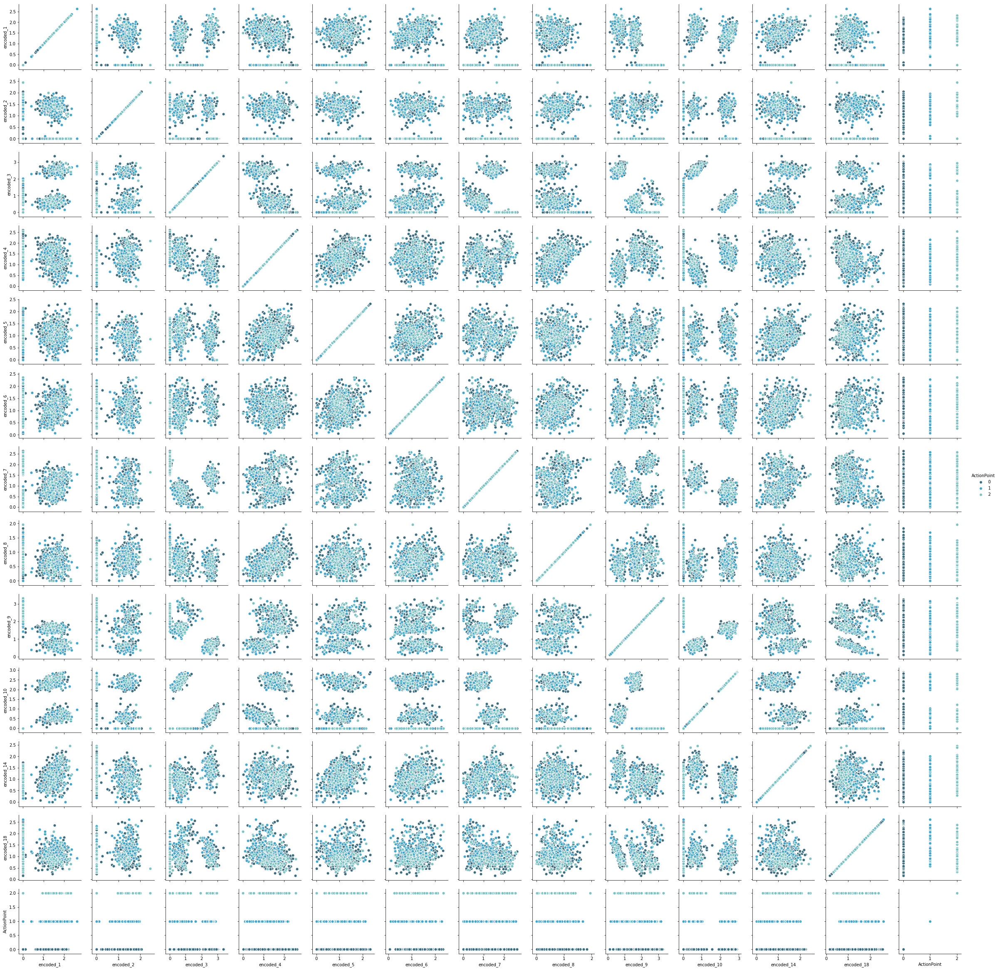

In [243]:
g = sns.PairGrid(data_plot, hue="ActionPoint", palette="GnBu_d")
g.map(plt.scatter, s=50, edgecolor="white")
g.add_legend();

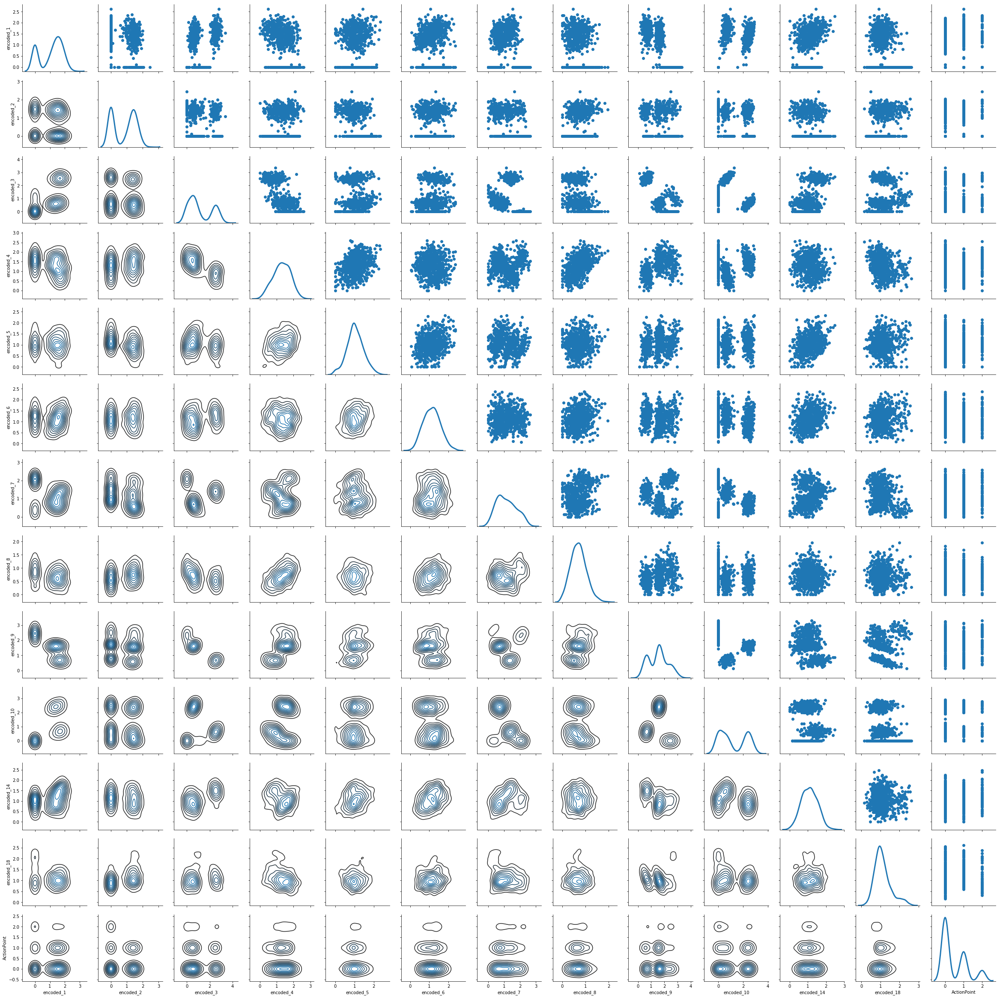

In [244]:
g = sns.PairGrid(data_plot)
g.map_upper(plt.scatter)
g.map_lower(sns.kdeplot)
g.map_diag(sns.kdeplot, lw=3, legend=False);

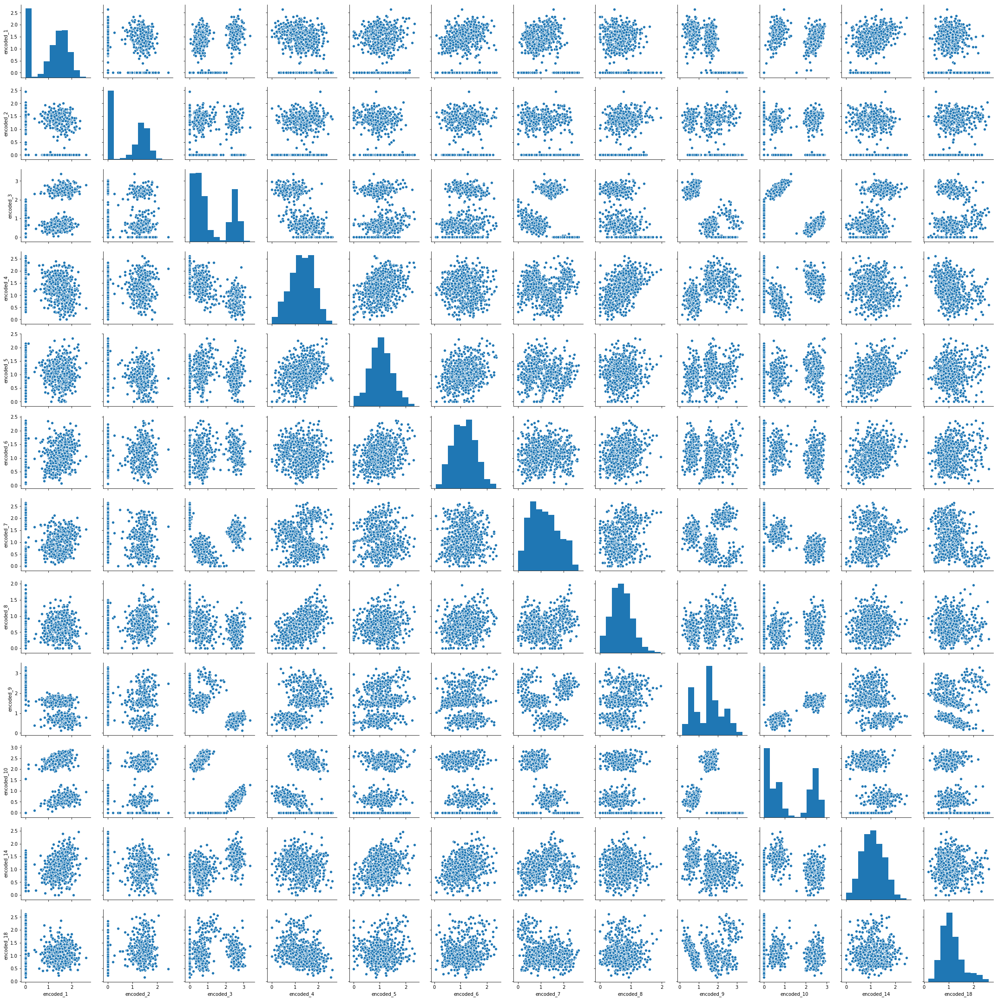

In [249]:
sns.pairplot(encoded_df);

In [231]:
## split into train and test
x_train, x_test, y_train, y_test = train_test_split(encoded_df, labels, test_size=0.4, random_state=786, stratify=labels)

In [232]:
## try with SVM
svm_model_encoder = SVC(C=10, kernel='linear', class_weight={0:1,1:1,2:5}, verbose=False, random_state=786)
svm_model_encoder.fit(x_train,y_train)
predictions = svm_model_encoder.predict(x_test)
print('Accuracy of SVM on train set: {:.2f}'.format(svm_model_encoder.score(x_train, y_train)))
print('Accuracy of SVM on test set: {:.2f}'.format(svm_model_encoder.score(x_test, y_test)))
confmatrix = confusion_matrix(y_test,predictions)
print(confmatrix)
print(classification_report(y_test, predictions))

Accuracy of SVM on train set: 0.52
Accuracy of SVM on test set: 0.48
[[98  9 58]
 [56  9 12]
 [ 4  2 22]]
             precision    recall  f1-score   support

          0       0.62      0.59      0.61       165
          1       0.45      0.12      0.19        77
          2       0.24      0.79      0.37        28

avg / total       0.53      0.48      0.46       270



In [251]:
decisiontree_model_encoder = tree.DecisionTreeClassifier(criterion='entropy',class_weight='balanced',random_state=786, max_depth=10)
decisiontree_model_encoder.fit(x_train,y_train)
train_accuracy= decisiontree_model_encoder.score(x_train,y_train)
test_accuracy= decisiontree_model_encoder.score(x_test,y_test)
predictions=decisiontree_model_encoder.predict(x_test)
print(classification_report(y_test, predictions))

             precision    recall  f1-score   support

          0       0.64      0.56      0.60       165
          1       0.38      0.45      0.41        77
          2       0.18      0.21      0.19        28

avg / total       0.52      0.49      0.50       270

